In [1]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('C:\\StudySources\\Master\\ERP\\Datasets\\2021\\combined_output.csv')

In [2]:
df = df[~df['2021 super output area - lower layer'].isna()]

In [3]:
df.describe

<bound method NDFrame.describe of      2021 super output area - lower layer   mnemonic  Total population 16+  \
0                             Bolton 005A  E01004766                 677.0   
1                             Bolton 005B  E01004767                 876.0   
2                             Bolton 001A  E01004768                 842.0   
3                             Bolton 003A  E01004769                 773.0   
4                             Bolton 003B  E01004770                 638.0   
...                                   ...        ...                   ...   
1734                      Manchester 064B  E01034138                 419.0   
1735                          Oldham 036A  E01034232                 464.0   
1736                          Oldham 036B  E01034233                 487.0   
1737                        Rochdale 008H  E01034234                 569.0   
1738                        Rochdale 008I  E01034235                 527.0   

      Aged 16 to 24 years  Ag

# Prepare Dataset

In [4]:
df = df.drop(columns=[col for col in df.columns
                            if 'Total' in col])

In [5]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Select only numeric columns for VIF calculation
# numeric_cols = df.select_dtypes(include='number').columns
# X = df[numeric_cols].dropna()

# # Calculate VIF for each numeric column
# vif_data = pd.DataFrame({
#     'feature': numeric_cols,
#     'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
# })

# # Show top 10 features with highest VIF
# vif_data_sorted = vif_data.sort_values('VIF', ascending=False)
# print(vif_data_sorted.head(10))

C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\statsmodels\regression\linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                               feature  VIF
83   Single family household: Cohabiting couple fam...  inf
70                  Full-time: 49 or more hours worked  inf
68                                           Full-time  inf
67                    Part-time: 16 to 30 hours worked  inf
66                  Part-time: 15 hours or less worked  inf
65                                           Part-time  inf
153                                    Lives rent free  inf
149                 Social rented: Other social rented  inf
59          Other ethnic group: Any other ethnic group  inf
58                            Other ethnic group: Arab  inf


In [ ]:
# # Show columns where VIF is less than or equal to 5
# non_inf_vif = vif_data[vif_data['VIF'] <= 100]
# print(non_inf_vif[['feature', 'VIF']])

                                               feature        VIF
4                               Aged 65 years and over  98.875727
14                              30km to less than 40km  27.372624
15                              40km to less than 60km  18.851834
16                                       60km and over  32.168832
99                               7 people in household  47.379149
100                      8 or more people in household  69.885809
101         Index of Multiple Deprivation (IMD) Decile  31.067651
102                A Agriculture, forestry and fishing   2.863616
103                             B Mining and quarrying   1.680133
105  D Electricity, gas, steam and air conditioning...  12.124959
106  E Water supply; sewerage, waste management and...  14.866560
113                           L Real estate activities  54.684014
134                                 population density   7.602386
166                     Other method of travel to work  35.039197


In [7]:
df['Rail Transit'] = df['Underground, metro, light rail, tram'] + df['Train']

In [8]:
df['Active Transit'] = df['Motorcycle, scooter or moped'] + df['Bicycle'] + df['On foot']

In [9]:
df['Public Transit'] = df['Rail Transit'] + df['Bus, minibus or coach'] + df['Taxi']

In [10]:
df['Cars'] = df['Driving a car or van'] + df['Passenger in a car or van']

In [11]:
transit_methods_general = ['Public Transit', 'Active Transit', 'Cars', 'Work mainly at or from home']
transit_method = ['Rail Transit', 'Bus, minibus or coach', 'Taxi', 'Motorcycle, scooter or moped', 'Bicycle', 'On foot', 'Cars', 'Work mainly at or from home']

# Analysis

## Education, Economic and Social Grade

Education:  
No qualifications	Level 1 and entry level qualifications	Level 2 qualifications	Apprenticeship	Level 3 qualifications	Level 4 qualifications or above	Other qualifications  
Economic:  
Index of Multiple Deprivation (IMD) Decile  
Social Grade:  
AB Higher and intermediate managerial/administrative/professional occupations	C1 Supervisory, clerical and junior managerial/administrative/professional occupations	C2 Skilled manual occupations	DE Semi-skilled and unskilled manual occupations; unemployed and lowest grade occupations

In [10]:
Factor1 = [
    # Education
    'No qualifications',
    'Level 1 and entry level qualifications',
    'Level 2 qualifications',
    'Apprenticeship',
    'Level 3 qualifications',
    'Level 4 qualifications or above',
    'Other qualifications',
    # Economic
    'Index of Multiple Deprivation (IMD) Decile',
    # Social Grade
    'AB Higher and intermediate managerial/administrative/professional occupations',
    'C1 Supervisory, clerical and junior managerial/administrative/professional occupations',
    'C2 Skilled manual occupations',
    'DE Semi-skilled and unskilled manual occupations; unemployed and lowest grade occupations'
]

In [11]:
df1 = df[Factor1 + transit_methods_general]

### Covariance

Top 5 absolute covariances:
Work mainly at or from home  Level 4 qualifications or above                                                              20341.778648
                             AB Higher and intermediate managerial/administrative/professional occupations                17827.042269
                             DE Semi-skilled and unskilled manual occupations; unemployed and lowest grade occupations    15849.476237
Public Transit               DE Semi-skilled and unskilled manual occupations; unemployed and lowest grade occupations     8208.686237
Work mainly at or from home  No qualifications                                                                             7903.144872
dtype: float64


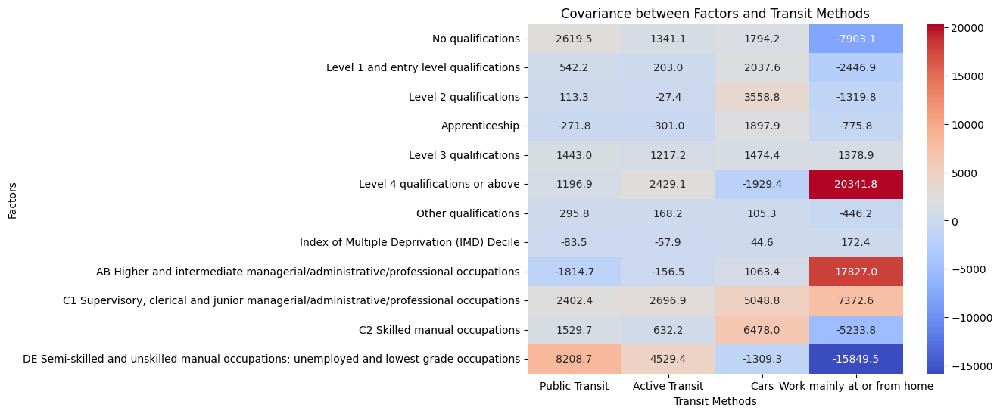

In [12]:
import seaborn as sns

# Compute covariance matrix between Factor1 and transit_methods_general
cov_matrix = df1[Factor1 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor1, transit_methods_general]

# Print top 5 absolute covariances between Factor1 and transit_methods_general
top5 = cov_factors_methods.abs().unstack().sort_values(ascending=False).head(5)
print("Top 5 absolute covariances:")
print(top5)

# Visualize all covariances as a heatmap
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cov_factors_methods, annot=True, fmt=".1f", cmap="coolwarm")
plt.title("Covariance between Factors and Transit Methods")
plt.ylabel("Factors")
plt.xlabel("Transit Methods")
plt.show()

### Dependency effect on network graph

C:\Users\Harry.Xie\AppData\Local\Temp\ipykernel_13920\765702264.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('coolwarm')


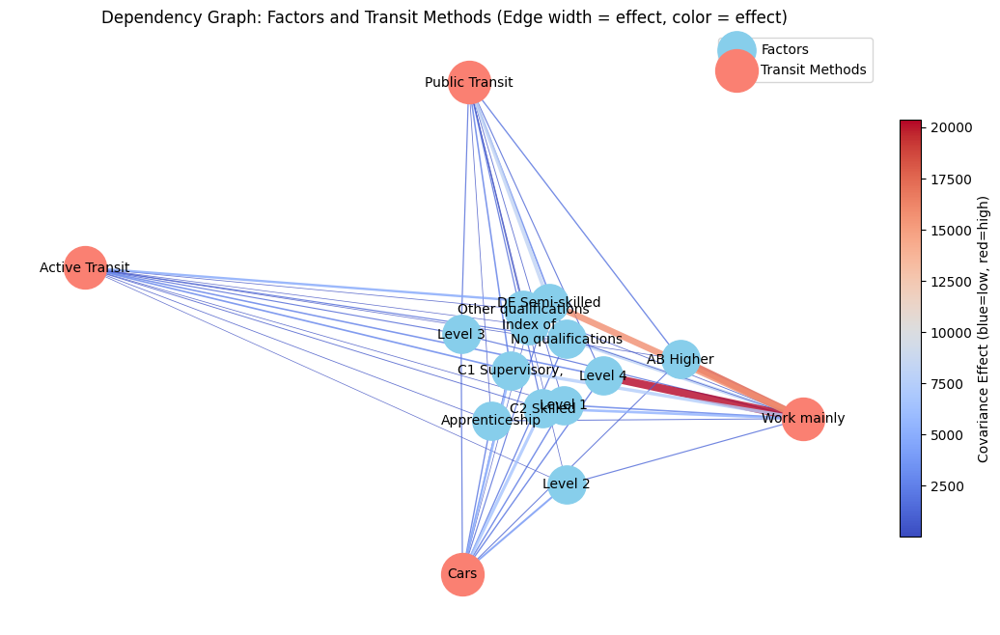

In [14]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Create a bipartite graph connecting factors and transit methods
G = nx.DiGraph()
G.add_nodes_from(Factor1, bipartite=0)
G.add_nodes_from(transit_methods_general, bipartite=1)

# Compute covariance matrix between Factor1 and transit_methods_general
cov_matrix = df1[Factor1 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor1, transit_methods_general]

edges = []
edge_widths = []
for factor in Factor1:
    for method in transit_methods_general:
        effect = abs(cov_factors_methods.loc[factor, method])
        if not np.isnan(effect):
            G.add_edge(factor, method, weight=effect)
            edges.append((factor, method))
            edge_widths.append(effect)

# Normalize edge widths for better visualization
if edge_widths:
    edge_widths_norm = np.interp(edge_widths, (min(edge_widths), max(edge_widths)), (0.5, 6))
else:
    edge_widths_norm = []

# Create a gradient color map from blue to red for edges
cmap = mpl.cm.get_cmap('coolwarm')
if edge_widths:
    # Normalize edge weights for color mapping
    norm = mpl.colors.Normalize(vmin=min(edge_widths), vmax=max(edge_widths))
    edge_colors = [cmap(norm(w)) for w in edge_widths]
else:
    edge_colors = []

# Shorten labels to first two words for visualization
def first_two_words(label):
    return ' '.join(label.split()[:2])

short_factor_labels = [first_two_words(f) for f in Factor1]
short_method_labels = [first_two_words(m) for m in transit_methods_general]

# Create mapping for relabeling
label_map = {**dict(zip(Factor1, short_factor_labels)), **dict(zip(transit_methods_general, short_method_labels))}

fig, ax = plt.subplots(figsize=(14, 8))
pos = nx.spring_layout(G, k=0.8, seed=42)
nx.draw_networkx_nodes(G, pos, nodelist=Factor1, node_color='skyblue', node_size=800, label='Factors', ax=ax)
nx.draw_networkx_nodes(G, pos, nodelist=transit_methods_general, node_color='salmon', node_size=1000, label='Transit Methods', ax=ax)
if edges:
    nx.draw_networkx_edges(
        G, pos, edgelist=edges, width=edge_widths_norm, edge_color=edge_colors, arrows=False, alpha=0.8, ax=ax
    )
nx.draw_networkx_labels(G, pos, labels=label_map, font_size=10, ax=ax)
ax.set_title("Dependency Graph: Factors and Transit Methods (Edge width = effect, color = effect)")
ax.axis('off')
ax.legend(["Factors", "Transit Methods"])
# Add colorbar for edge colors
if edge_widths:
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cbar.set_label('Covariance Effect (blue=low, red=high)')
plt.show()


### Random forest

In [12]:
from sklearn.ensemble import RandomForestRegressor

X = df1[Factor1]
y = df1[transit_methods_general[0]]  # Example: predicting 'Public Transit'

rf = RandomForestRegressor(random_state=42)
rf.fit(X, y)

print("Random Forest fitted on Factor1 to predict transit_methods_general.")

Random Forest fitted on Factor1 to predict transit_methods_general.


### Random forest factor effect

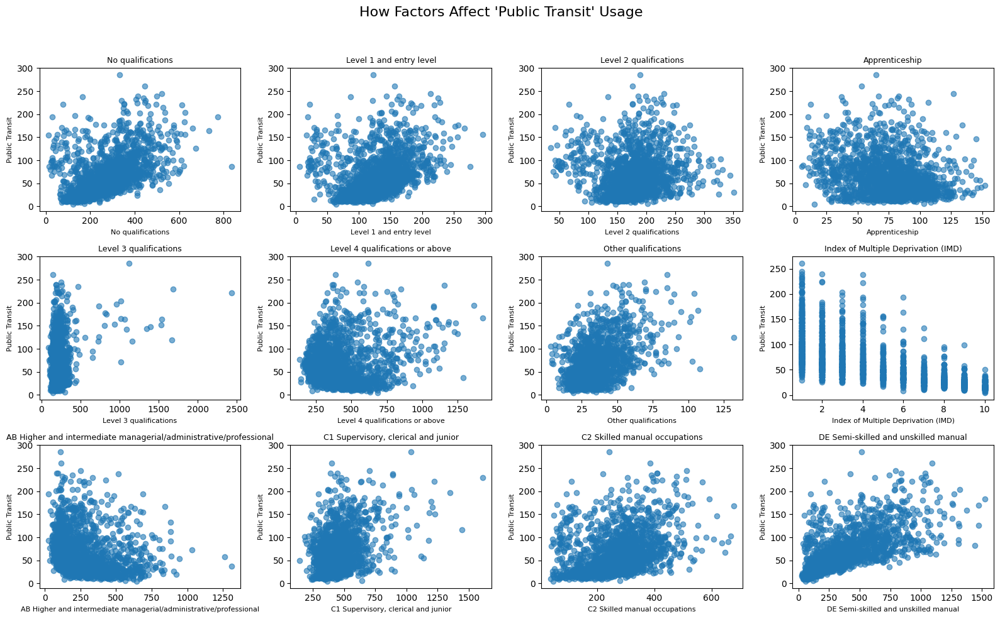

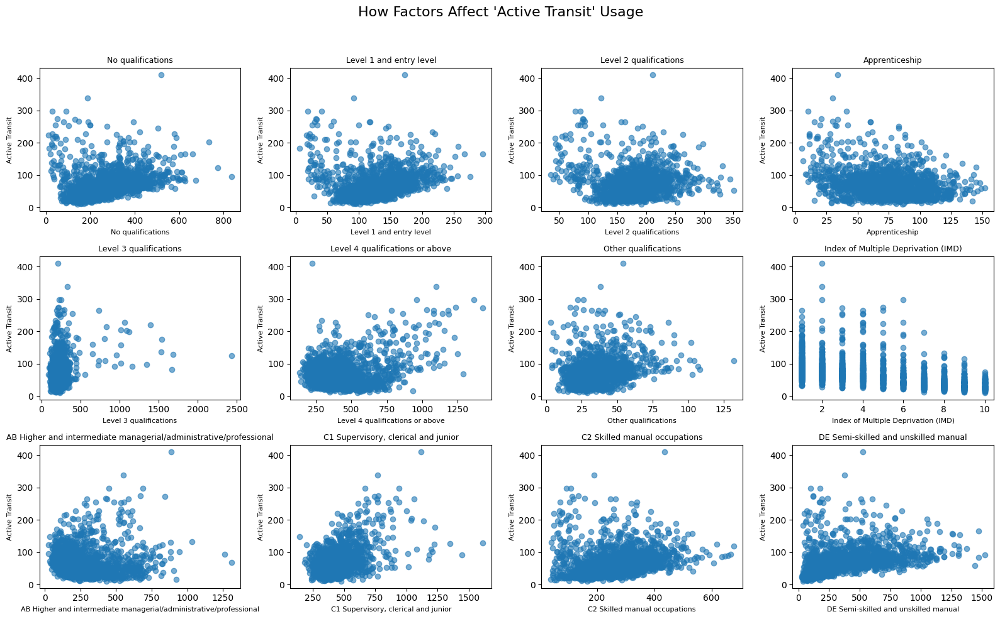

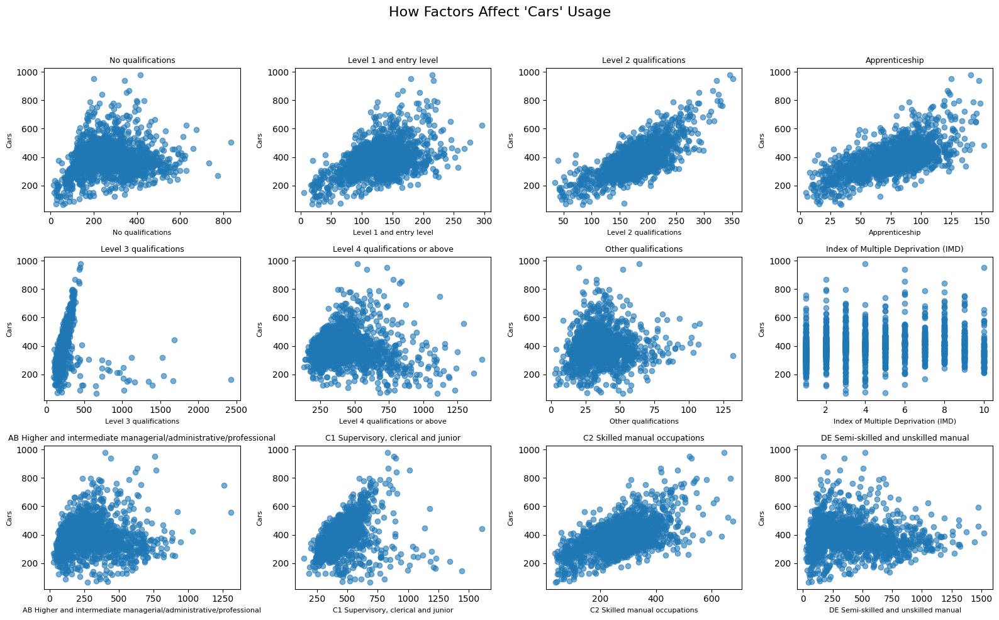

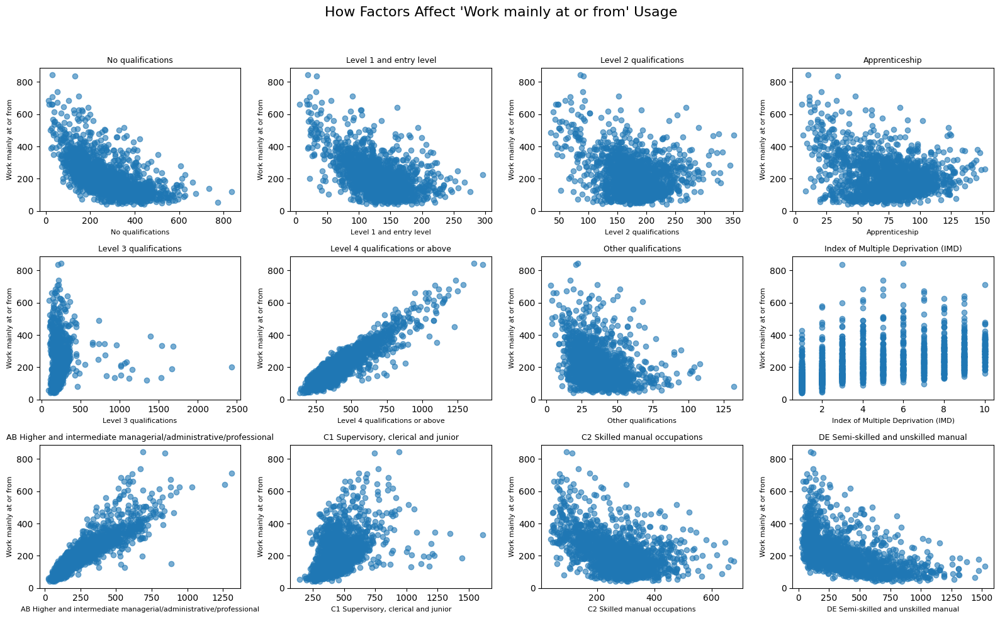

In [ ]:
import matplotlib.pyplot as plt

methods = transit_methods_general
factors_to_plot = Factor1

n_factors = len(factors_to_plot)

for method in methods:
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
    axes = axes.flatten()

    for i, factor in enumerate(factors_to_plot):
        if factor in df1.columns and method in df1.columns:
            # Shorten column names to first 5 words
            short_factor = ' '.join(str(factor).split()[:5])
            short_method = ' '.join(str(method).split()[:5])
            axes[i].scatter(df1[factor], df1[method], alpha=0.6)
            axes[i].set_title(short_factor, fontsize=9)
            axes[i].set_xlabel(short_factor, fontsize=8)
            axes[i].set_ylabel(short_method, fontsize=8)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"How Factors Affect '{' '.join(str(method).split()[:5])}' Usage", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


### Top 5 effects

In [29]:
X = df1[Factor1]

results = {}

for method in transit_methods_general:
    y = df1[method]
    model = RandomForestRegressor(random_state=0)
    model.fit(X, y)

    importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    results[method] = importance_df.head(5)

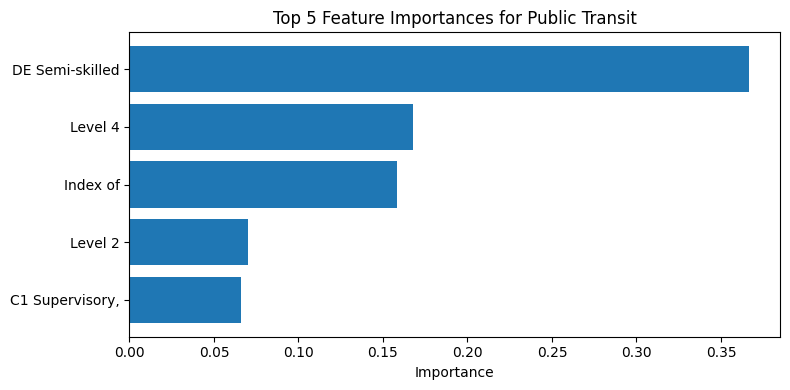

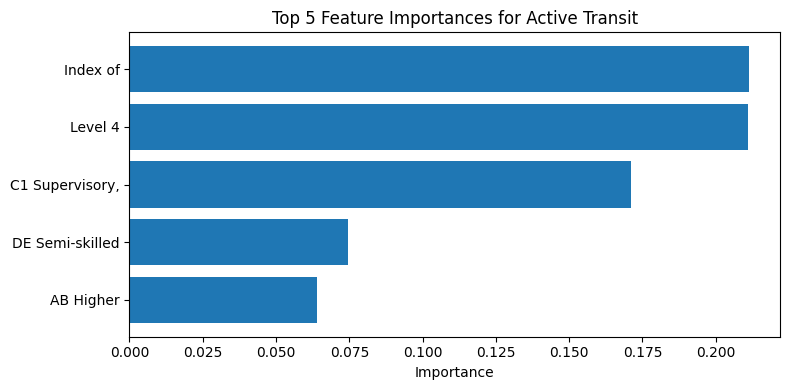

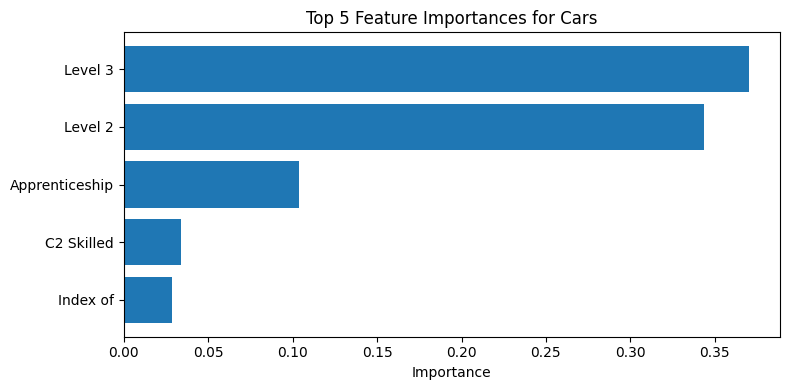

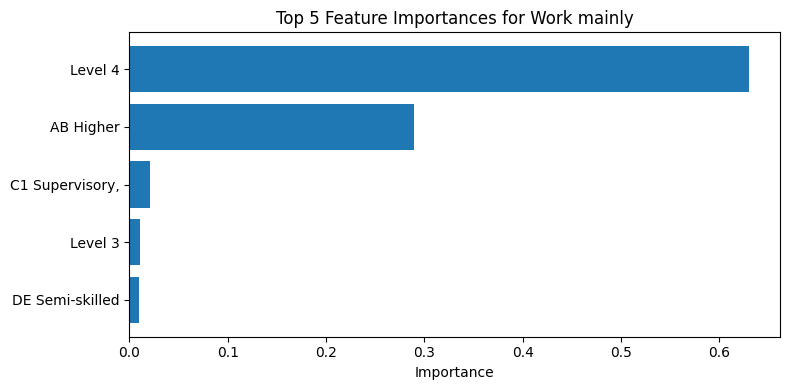

In [32]:
import matplotlib.pyplot as plt
for method, importance_df in results.items():
    # Shorten feature names to first two words
    short_features = [' '.join(str(f).split()[:2]) for f in importance_df['Feature']]
    plt.figure(figsize=(8, 4))
    plt.barh(short_features, importance_df['Importance'])
    plt.xlabel('Importance')
    plt.title(f"Top 5 Feature Importances for {' '.join(method.split()[:2])}")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

### Top 5 effects Partial Dependence

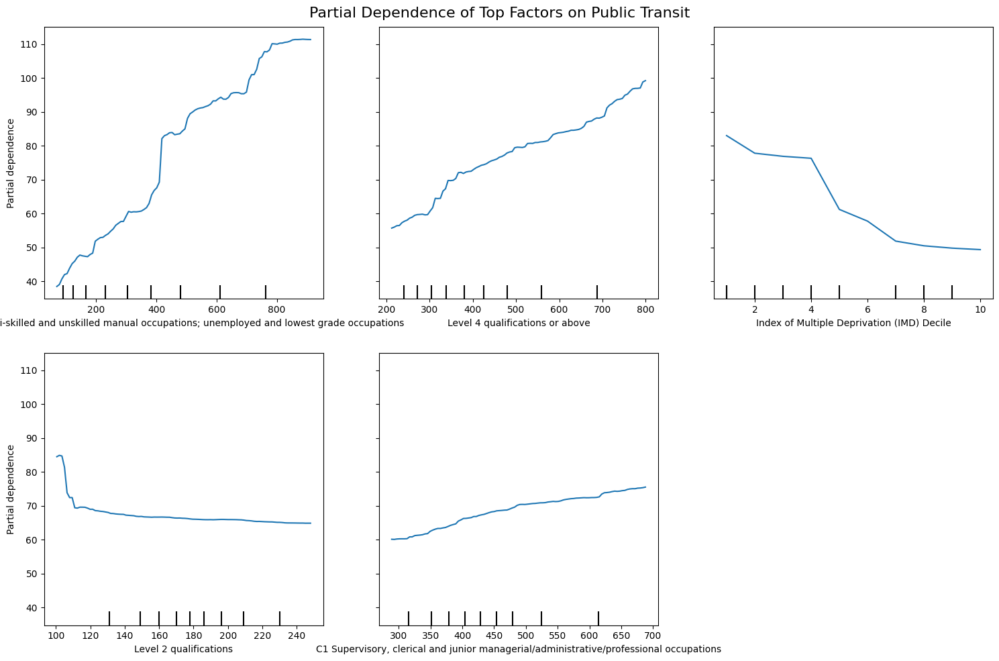

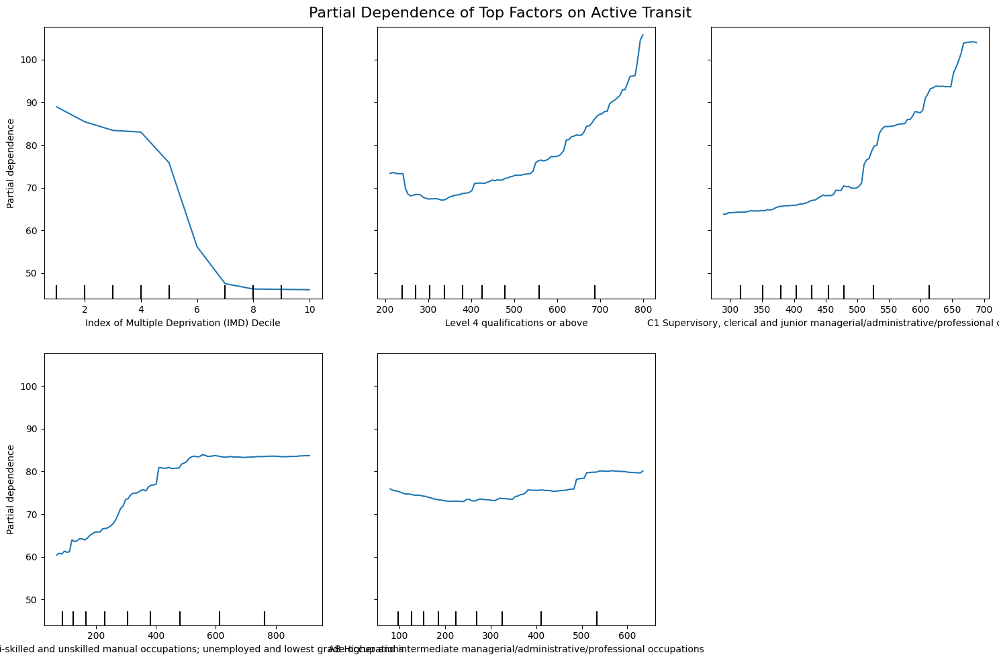

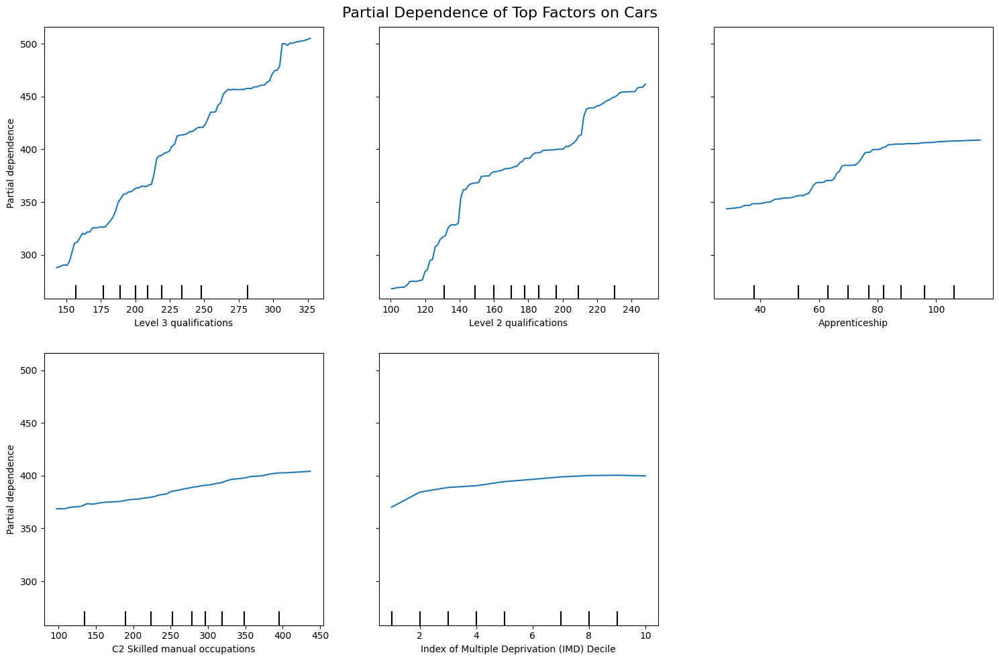

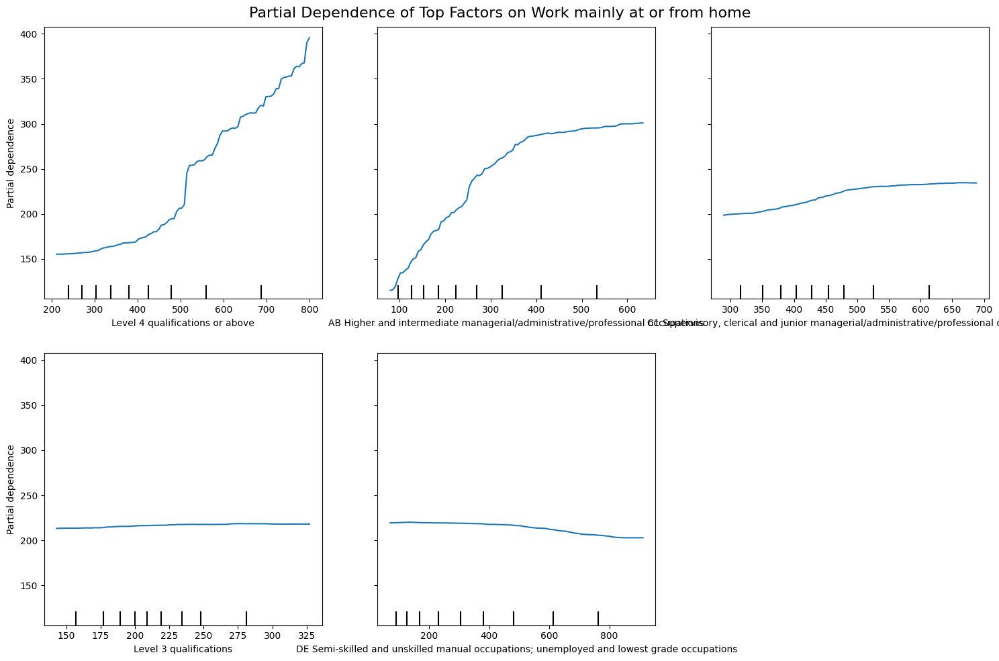

In [31]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

for method in transit_methods_general:
    model.fit(X, df1[method])

    features_to_plot = results[method]['Feature'].tolist()

    fig, ax = plt.subplots(figsize=(15, 10))
    PartialDependenceDisplay.from_estimator(model, X, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence of Top Factors on {method}", fontsize=16)
    plt.tight_layout()
    plt.show()


## Age, Gender, health, social grade

Age:  
Aged 16 to 24 years	Aged 25 to 34 years	Aged 35 to 49 years	Aged 50 to 64 years	Aged 65 years and over  
Gender:  
Female	Male  
Health:  
Very good health	Good health	Fair health	Bad health	Very bad health  
Household Size:  
0 people in household	1 person in household	2 people in household	3 people in household	4 people in household	5 people in household	6 people in household	7 people in household	8 or more people in household


In [21]:
Factor2 = [
    'Aged 16 to 24 years',
    'Aged 25 to 34 years',
    'Aged 35 to 49 years',
    'Aged 50 to 64 years',
    'Aged 65 years and over',
    'Female',
    'Male',
    'Very good health',
    'Good health',
    'Fair health',
    'Bad health',
    'Very bad health',
    # '0 people in household',
    # '1 person in household',
    # '2 people in household',
    # '3 people in household',
    # '4 people in household',
    # '5 people in household',
    # '6 people in household',
    # '7 people in household',
    # '8 or more people in household'
]

In [22]:
df2 = df[Factor2 + transit_methods_general]

### Covariance

Top 5 absolute covariances:
Work mainly at or from home  Very good health       9173.867686
Cars                         Female                 7289.571668
Work mainly at or from home  Aged 25 to 34 years    6683.179587
Cars                         Very good health       6020.823329
                             Male                   5701.335505
dtype: float64


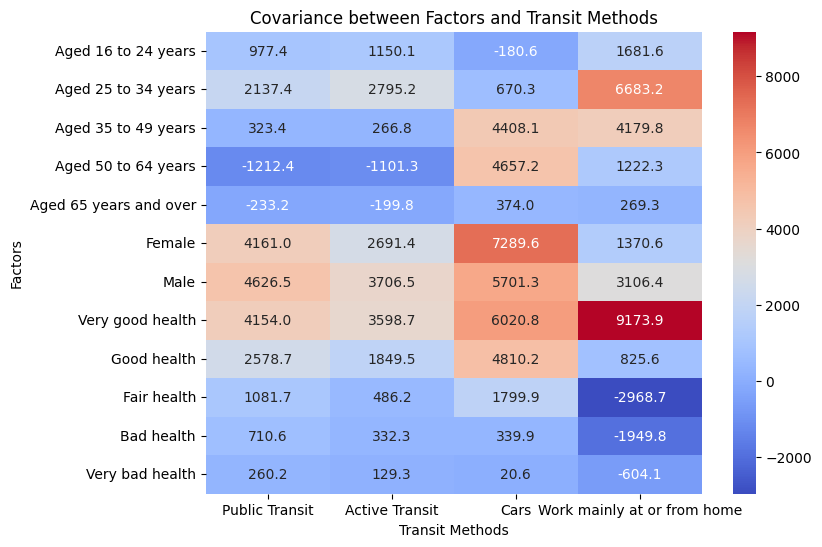

In [23]:
import seaborn as sns

# Compute covariance matrix between Factor2 and transit_methods_general
cov_matrix = df2[Factor2 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor2, transit_methods_general]

# Print top 5 absolute covariances between Factor2 and transit_methods_general
top5 = cov_factors_methods.abs().unstack().sort_values(ascending=False).head(5)
print("Top 5 absolute covariances:")    
print(top5)

# Visualize all covariances as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cov_factors_methods, annot=True, fmt=".1f", cmap="coolwarm")
plt.title("Covariance between Factors and Transit Methods")
plt.ylabel("Factors")
plt.xlabel("Transit Methods")
plt.show()

### Dependency effect on network graph

C:\Users\Harry.Xie\AppData\Local\Temp\ipykernel_9564\1753601281.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('coolwarm')


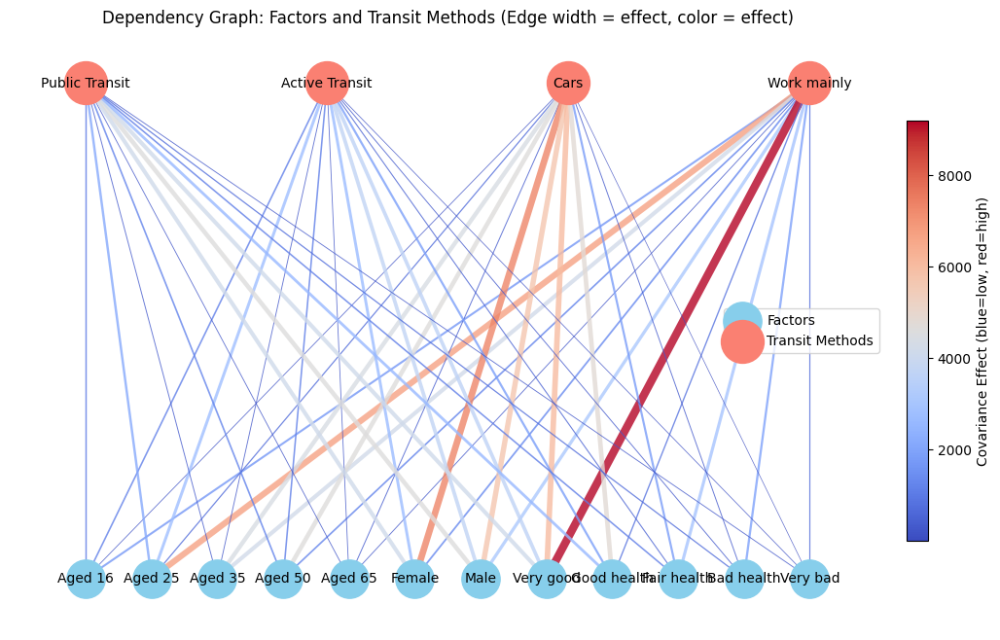

In [26]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Create a bipartite graph connecting factors and transit methods
G = nx.DiGraph()
G.add_nodes_from(Factor2, bipartite=0)
G.add_nodes_from(transit_methods_general, bipartite=1)

# Compute covariance matrix between Factor2 and transit_methods_general
cov_matrix = df2[Factor2 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor2, transit_methods_general]

edges = []
edge_widths = []
for factor in Factor2:
    for method in transit_methods_general:
        effect = abs(cov_factors_methods.loc[factor, method])
        if not np.isnan(effect):
            G.add_edge(factor, method, weight=effect)
            edges.append((factor, method))
            edge_widths.append(effect)

# Normalize edge widths for better visualization
if edge_widths:
    edge_widths_norm = np.interp(edge_widths, (min(edge_widths), max(edge_widths)), (0.5, 6))
else:
    edge_widths_norm = []

# Create a gradient color map from blue to red for edges
cmap = mpl.cm.get_cmap('coolwarm')
if edge_widths:
    # Normalize edge weights for color mapping
    norm = mpl.colors.Normalize(vmin=min(edge_widths), vmax=max(edge_widths))
    edge_colors = [cmap(norm(w)) for w in edge_widths]
else:
    edge_colors = []

# Shorten labels to first two words for visualization
def first_two_words(label):
    return ' '.join(label.split()[:2])

short_factor_labels = [first_two_words(f) for f in Factor2]
short_method_labels = [first_two_words(m) for m in transit_methods_general]

# Create mapping for relabeling
label_map = {**dict(zip(Factor2, short_factor_labels)), **dict(zip(transit_methods_general, short_method_labels))}

fig, ax = plt.subplots(figsize=(14, 8))
# pos = nx.spring_layout(G, k=0.8, seed=42)
# Create position layout
from networkx.algorithms import bipartite

pos = nx.bipartite_layout(G, nodes=Factor2, align='horizontal')
nx.draw_networkx_nodes(G, pos, nodelist=Factor2, node_color='skyblue', node_size=800, label='Factors', ax=ax)
nx.draw_networkx_nodes(G, pos, nodelist=transit_methods_general, node_color='salmon', node_size=1000, label='Transit Methods', ax=ax)
if edges:
    nx.draw_networkx_edges(
        G, pos, edgelist=edges, width=edge_widths_norm, edge_color=edge_colors, arrows=False, alpha=0.8, ax=ax
    )
nx.draw_networkx_labels(G, pos, labels=label_map, font_size=10, ax=ax)
ax.set_title("Dependency Graph: Factors and Transit Methods (Edge width = effect, color = effect)")
ax.axis('off')
ax.legend(["Factors", "Transit Methods"])
# Add colorbar for edge colors
if edge_widths:
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cbar.set_label('Covariance Effect (blue=low, red=high)')
plt.show()


### Random forest

In [27]:
from sklearn.ensemble import RandomForestRegressor

X = df2[Factor2]
y = df2[transit_methods_general[0]]  # Example: predicting 'Public Transit'

rf = RandomForestRegressor(random_state=42)
rf.fit(X, y)

print("Random Forest fitted on Factor2 to predict transit_methods_general.")

Random Forest fitted on Factor2 to predict transit_methods_general.


### Random forest factor effect

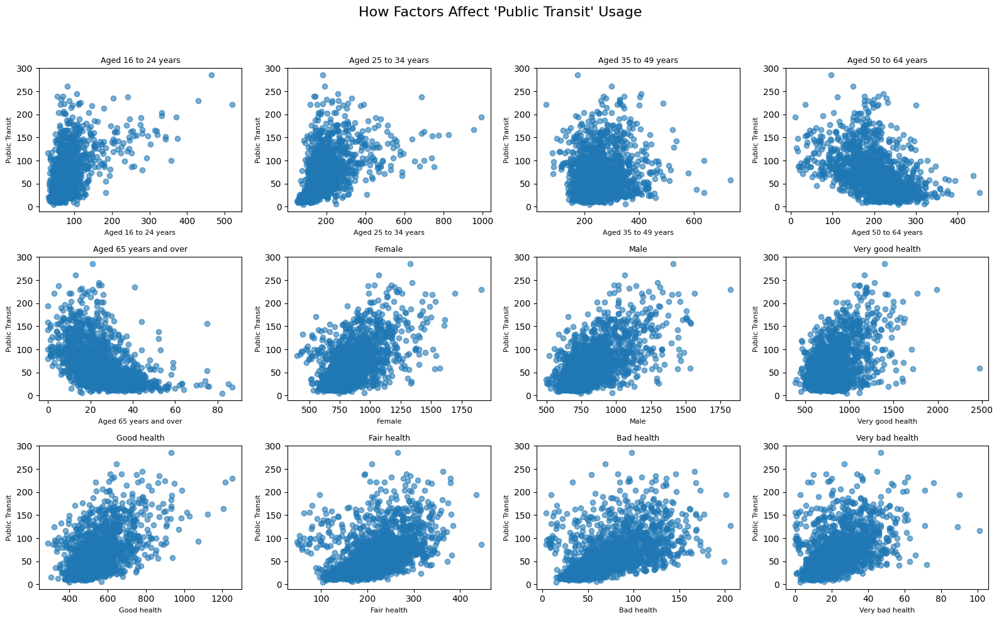

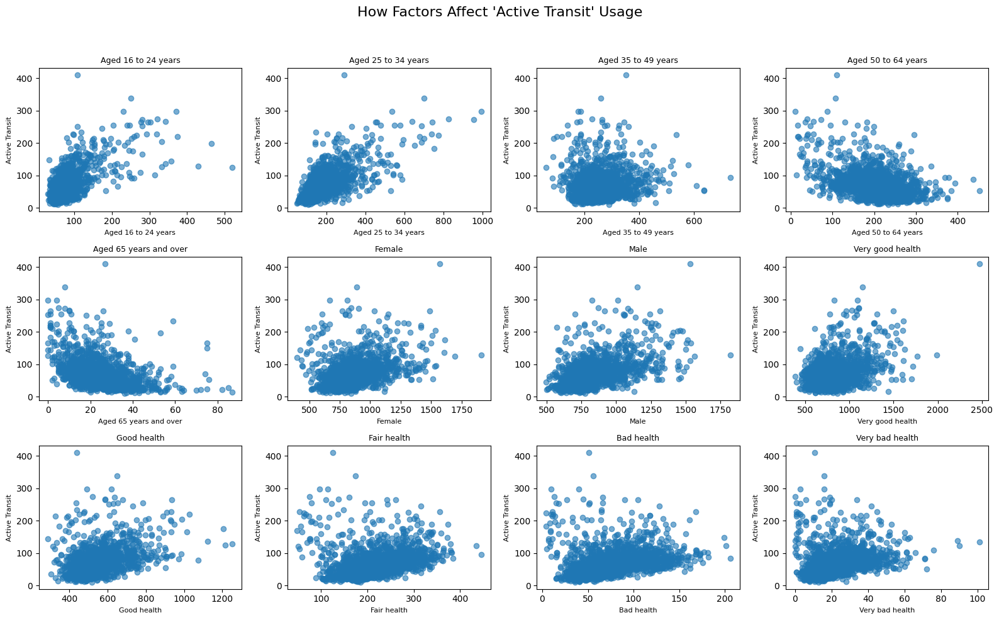

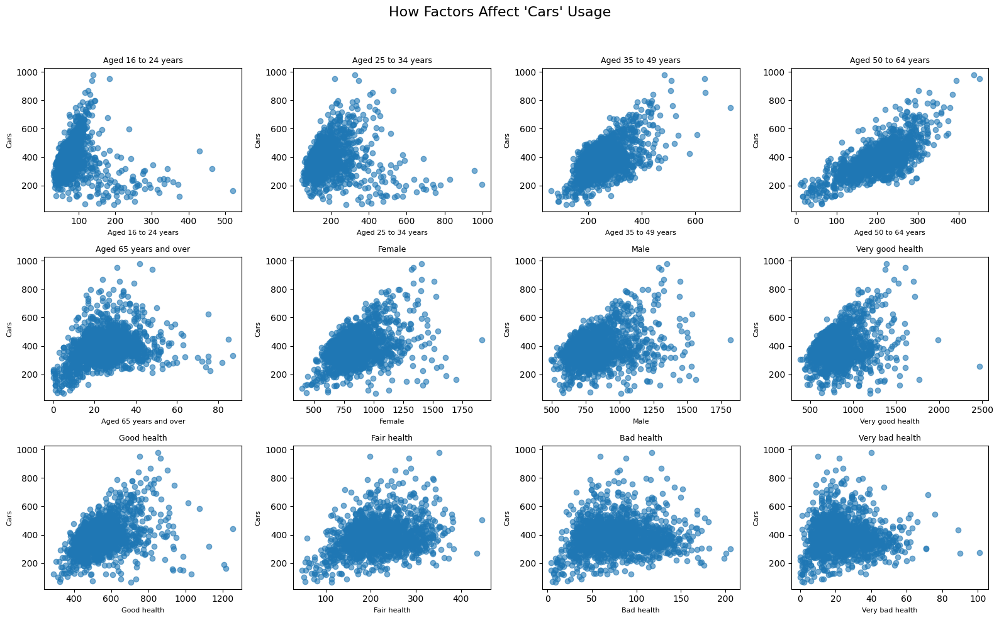

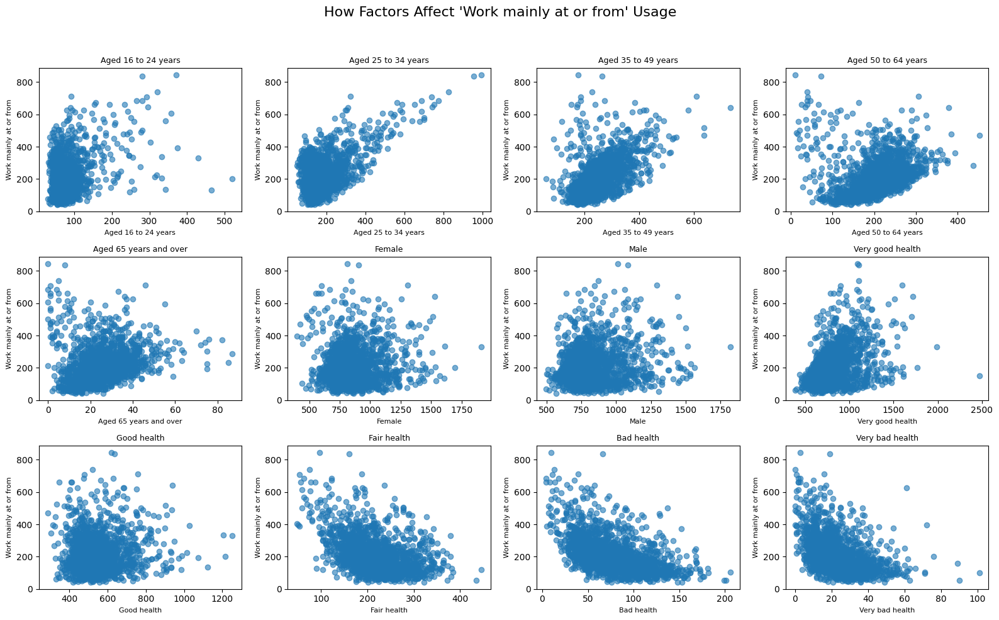

In [30]:
import matplotlib.pyplot as plt

methods = transit_methods_general
factors_to_plot = Factor2             

n_factors = len(factors_to_plot)

for method in methods:
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
    axes = axes.flatten()

    for i, factor in enumerate(factors_to_plot):
        if factor in df2.columns and method in df2.columns:
            # Shorten column names to first 5 words
            short_factor = ' '.join(str(factor).split()[:5])
            short_method = ' '.join(str(method).split()[:5])
            axes[i].scatter(df2[factor], df2[method], alpha=0.6)
            axes[i].set_title(short_factor, fontsize=9)
            axes[i].set_xlabel(short_factor, fontsize=8)
            axes[i].set_ylabel(short_method, fontsize=8)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"How Factors Affect '{' '.join(str(method).split()[:5])}' Usage", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


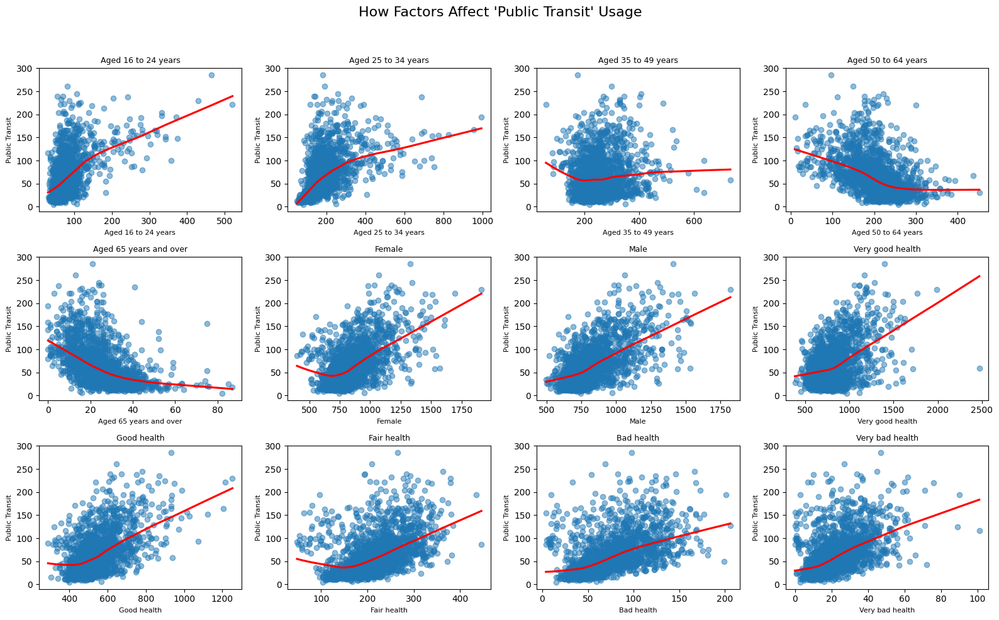

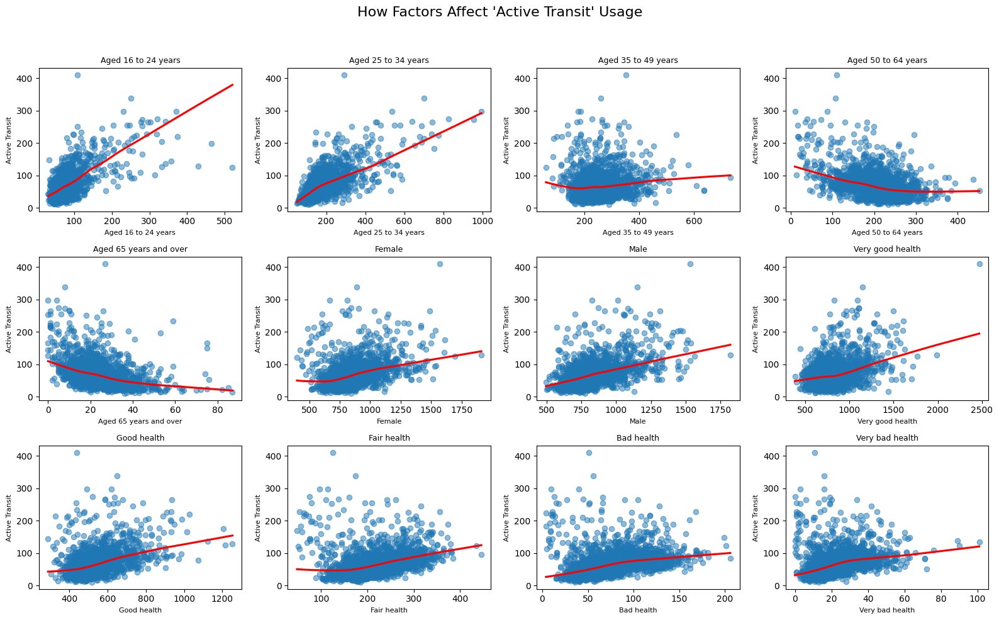

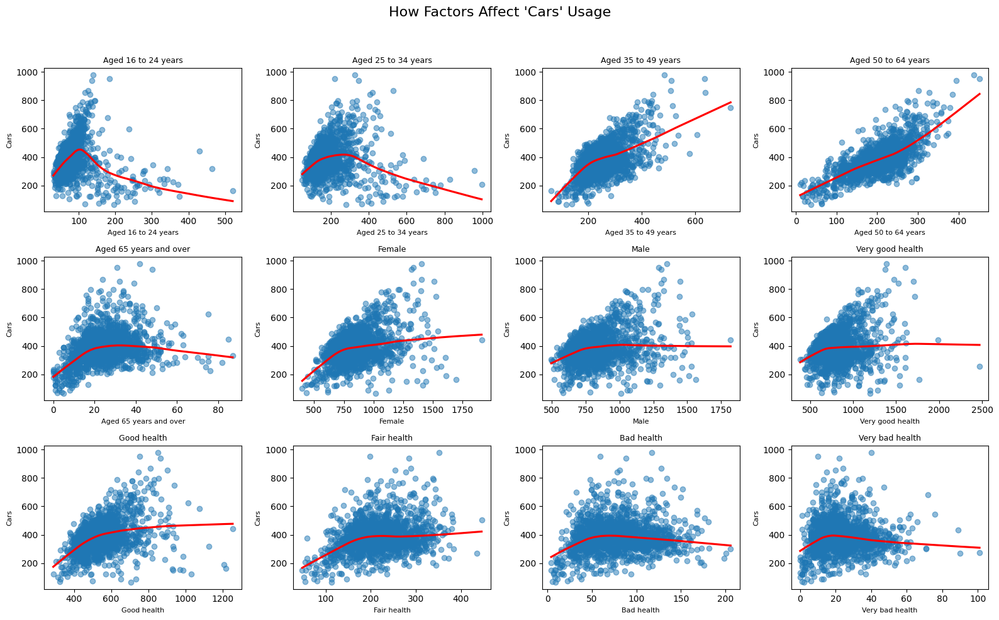

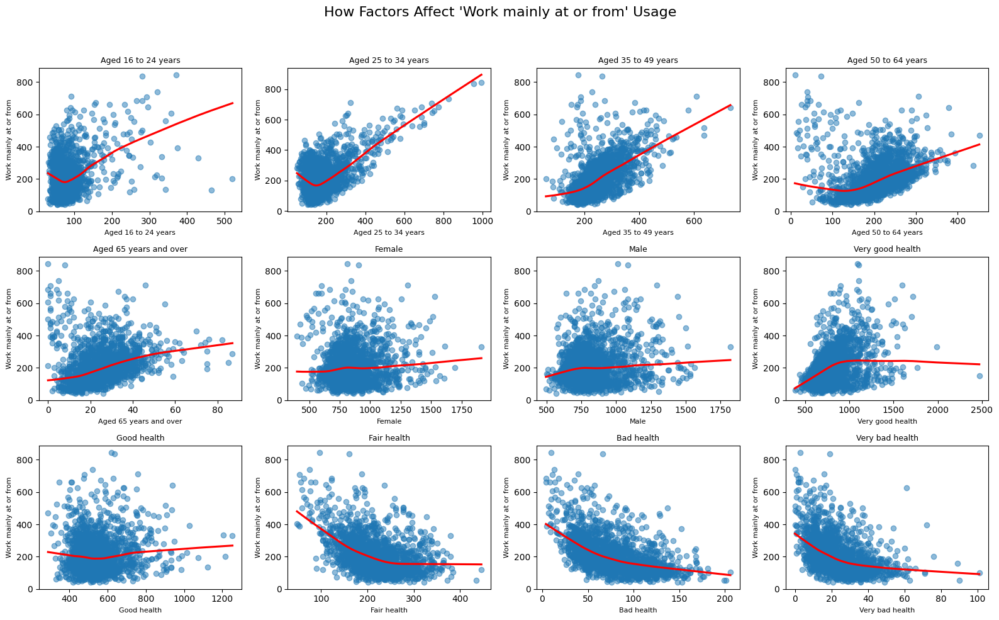

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns  # <-- NEW import

methods = transit_methods_general
factors_to_plot = Factor2

n_factors = len(factors_to_plot)

for method in methods:
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
    axes = axes.flatten()

    for i, factor in enumerate(factors_to_plot):
        if factor in df2.columns and method in df2.columns:
            # Shorten labels
            short_factor = ' '.join(str(factor).split()[:5])
            short_method = ' '.join(str(method).split()[:5])

            # Scatter with regression line (lowess for curve)
            sns.regplot(
                x=df2[factor],
                y=df2[method],
                ax=axes[i],
                scatter_kws={'alpha': 0.5},
                line_kws={'color': 'red'},
                lowess=True  # ← Change to False if you prefer straight lines
            )

            axes[i].set_title(short_factor, fontsize=9)
            axes[i].set_xlabel(short_factor, fontsize=8)
            axes[i].set_ylabel(short_method, fontsize=8)

    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"How Factors Affect '{' '.join(str(method).split()[:5])}' Usage", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


### Top 5 effects

In [32]:
X = df2[Factor2]

results = {}

for method in transit_methods_general:
    y = df2[method]
    model = RandomForestRegressor(random_state=0)
    model.fit(X, y)

    importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    results[method] = importance_df.head(5)

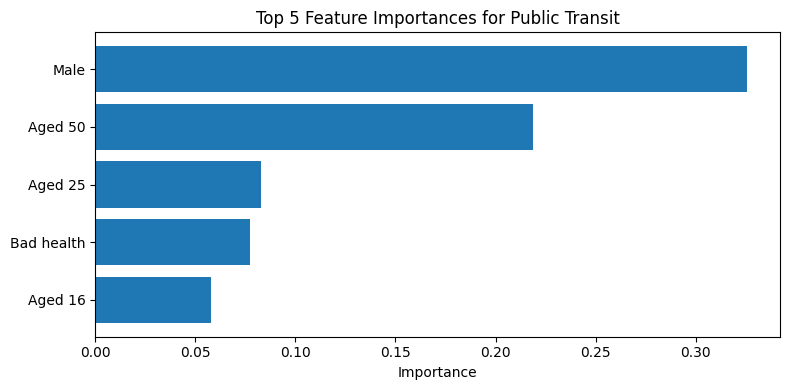

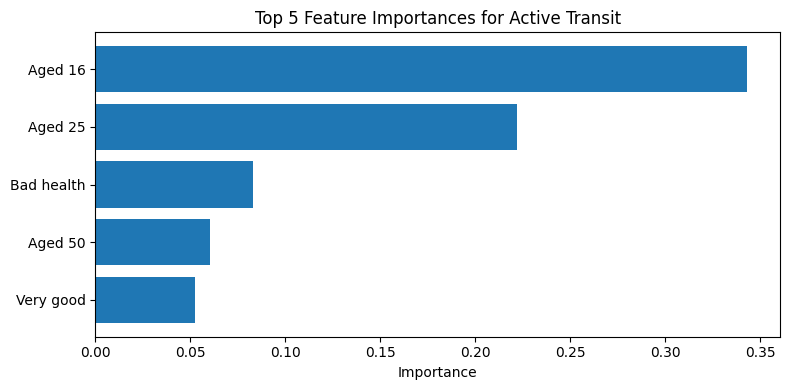

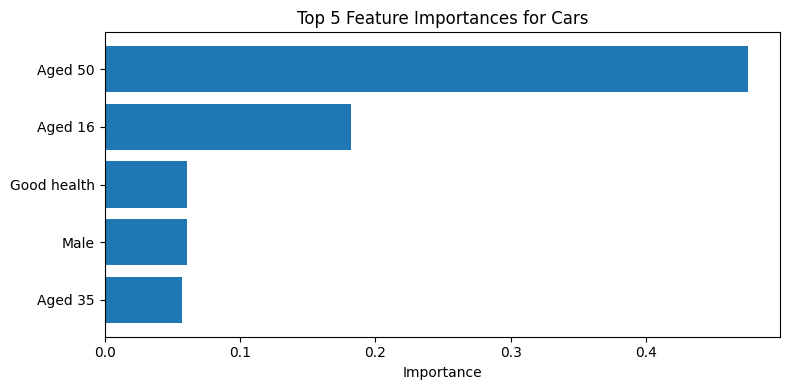

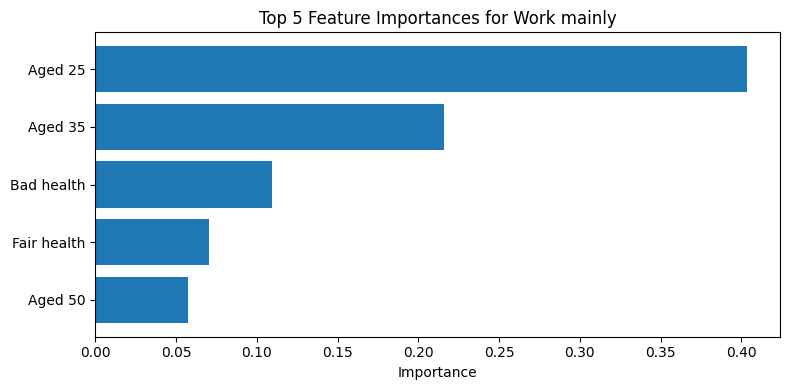

In [33]:
import matplotlib.pyplot as plt
for method, importance_df in results.items():
    # Shorten feature names to first two words
    short_features = [' '.join(str(f).split()[:2]) for f in importance_df['Feature']]
    plt.figure(figsize=(8, 4))
    plt.barh(short_features, importance_df['Importance'])
    plt.xlabel('Importance')
    plt.title(f"Top 5 Feature Importances for {' '.join(method.split()[:2])}")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

### Top 5 effects Partial Dependence

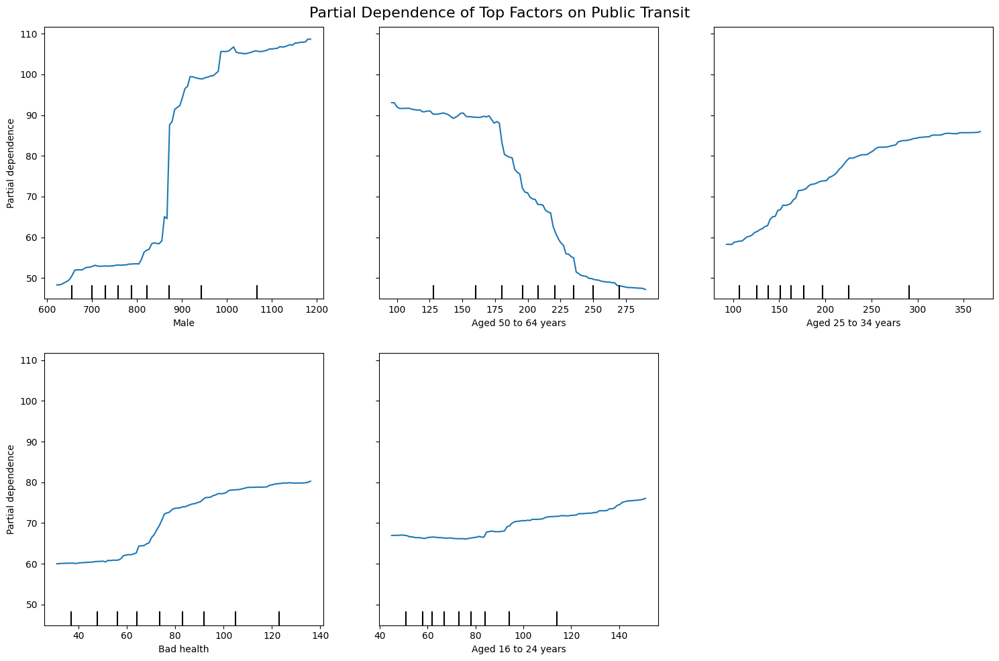

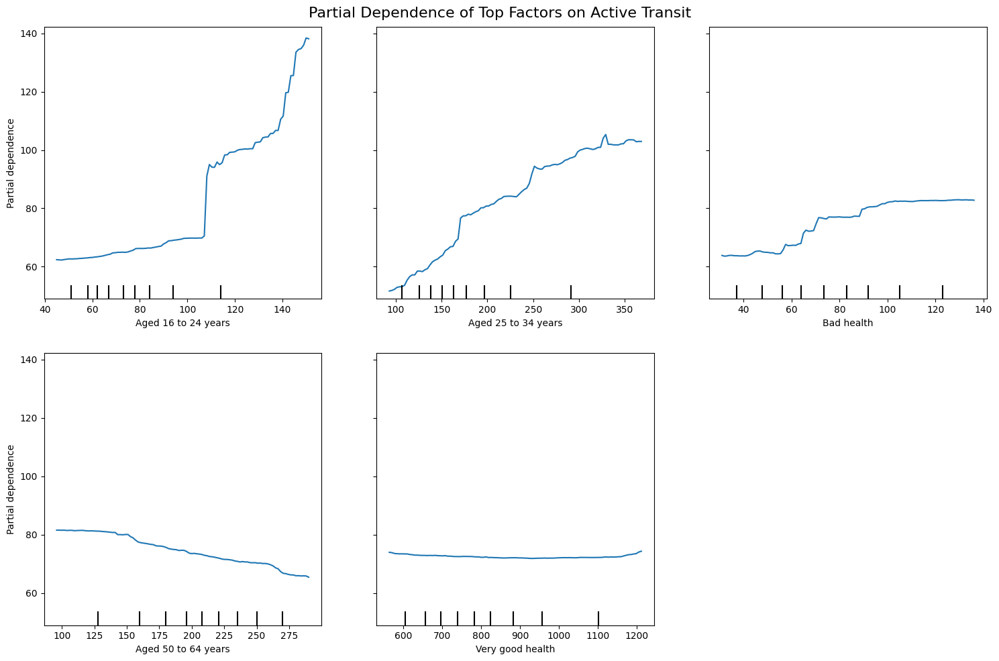

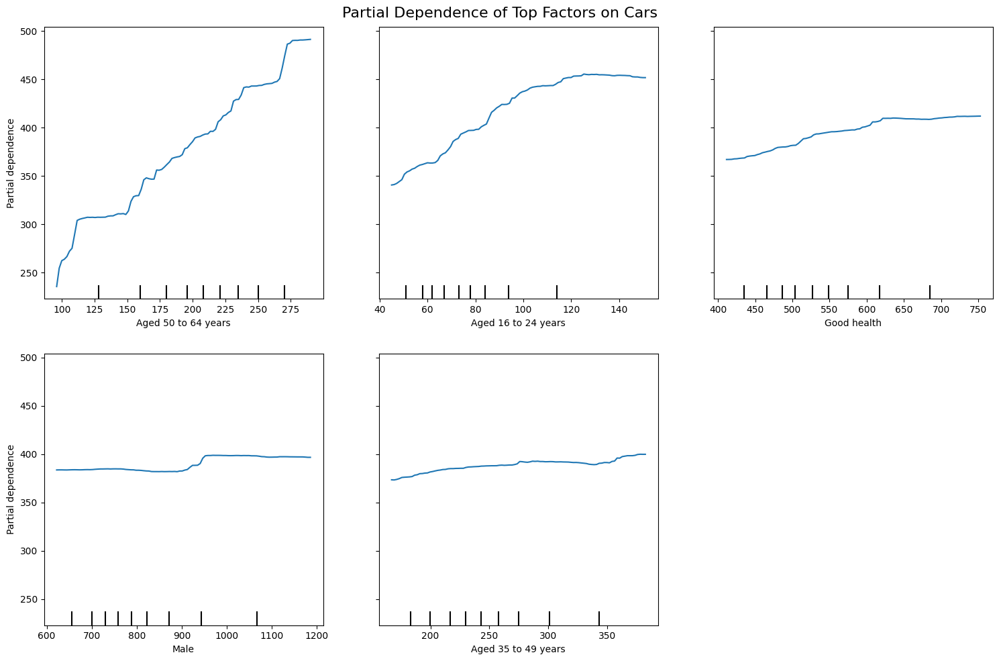

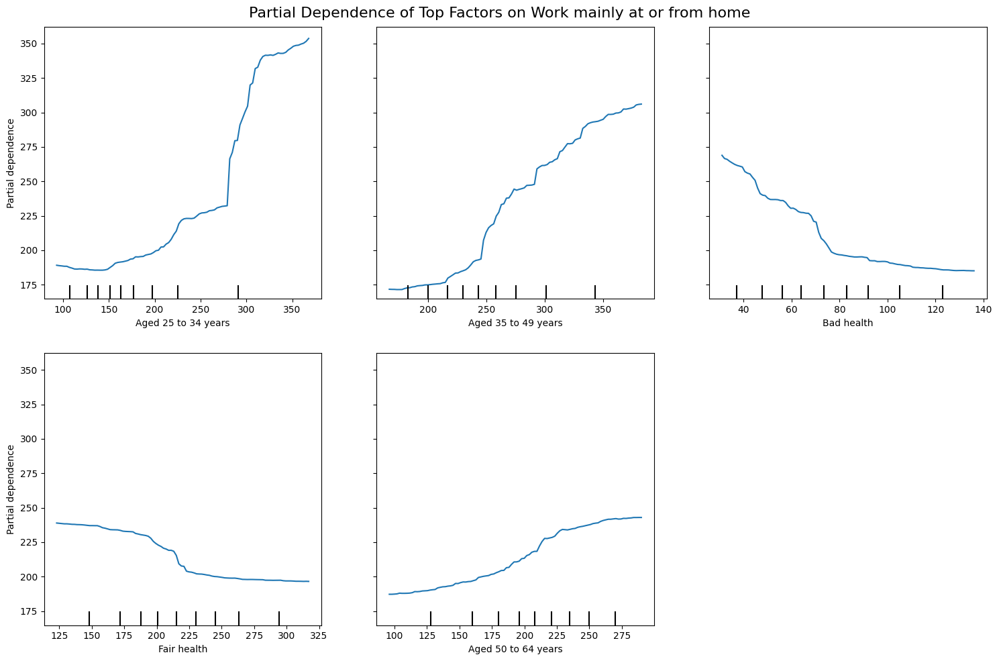

In [35]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

for method in transit_methods_general:
    model.fit(X, df2[method])

    features_to_plot = results[method]['Feature'].tolist()

    fig, ax = plt.subplots(figsize=(15, 10))
    PartialDependenceDisplay.from_estimator(model, X, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence of Top Factors on {method}", fontsize=16)
    plt.tight_layout()
    plt.show()

## Car Ownership, Work Distance

Car Ownership:  
No cars or vans in household	1 car or van in household	2 cars or vans in household	3 cars or vans in household	4 or more cars or vans in household  
Work Distance:  
Less than 2km	2km to less than 5km	5km to less than 10km	10km to less than 20km	20km to less than 30km	30km to less than 40km	40km to less than 60km	60km and over	Work mainly at or from home



In [12]:
Factor3 = [
    # Car Ownership
    'No cars or vans in household',
    '1 car or van in household',
    '2 cars or vans in household',
    '3 or more cars or vans in household',
    # Work Distance
    'Less than 2km',
    '2km to less than 5km',
    '5km to less than 10km',
    '10km to less than 20km',
    '20km to less than 30km',
    '30km to less than 40km',
    '40km to less than 60km',
    '60km and over'
]

In [13]:
df3 = df[Factor3 + transit_methods_general]

### Covariance

Top 5 absolute covariances:
Cars                         2 cars or vans in household     5114.138894
Public Transit               No cars or vans in household    4254.106219
Cars                         No cars or vans in household    4024.398282
Active Transit               No cars or vans in household    3750.243591
Work mainly at or from home  2 cars or vans in household     3144.469155
dtype: float64


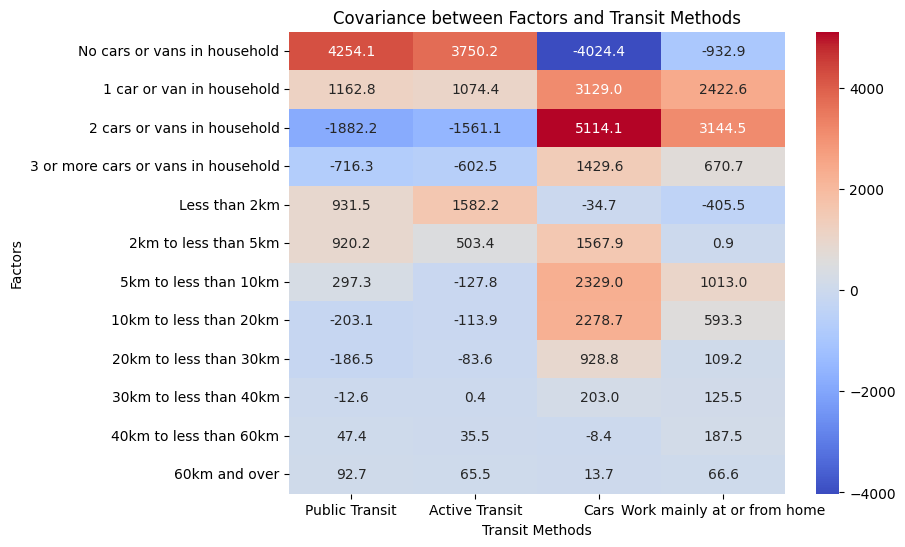

In [14]:
import seaborn as sns

# Compute covariance matrix between Factor3 and transit_methods_general
cov_matrix = df3[Factor3 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor3, transit_methods_general]

# Print top 5 absolute covariances between Factor3 and transit_methods_general
top5 = cov_factors_methods.abs().unstack().sort_values(ascending=False).head(5)
print("Top 5 absolute covariances:")
print(top5)

# Visualize all covariances as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cov_factors_methods, annot=True, fmt=".1f", cmap="coolwarm")
plt.title("Covariance between Factors and Transit Methods")
plt.ylabel("Factors")
plt.xlabel("Transit Methods")
plt.show()

### Dependency effect on network graph

C:\Users\Harry.Xie\AppData\Local\Temp\ipykernel_33828\2530049364.py:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap('coolwarm')


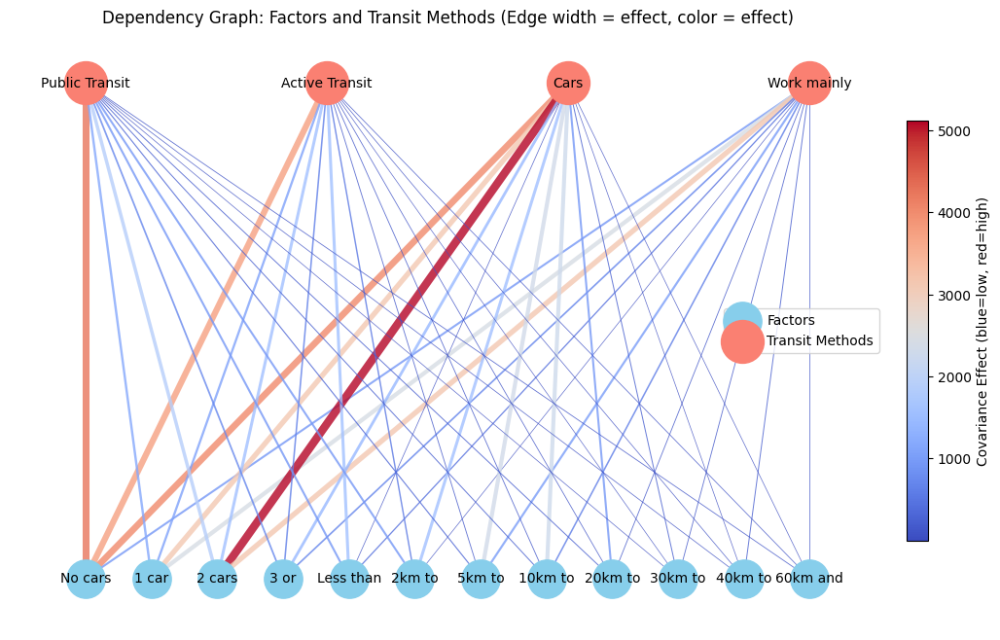

In [15]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl

# Create a bipartite graph connecting factors and transit methods
G = nx.DiGraph()
G.add_nodes_from(Factor3, bipartite=0)
G.add_nodes_from(transit_methods_general, bipartite=1)

# Compute covariance matrix between Factor3 and transit_methods_general
cov_matrix = df3[Factor3 + transit_methods_general].cov()
cov_factors_methods = cov_matrix.loc[Factor3, transit_methods_general]

edges = []
edge_widths = []
for factor in Factor3:
    for method in transit_methods_general:
        effect = abs(cov_factors_methods.loc[factor, method])
        if not np.isnan(effect):
            G.add_edge(factor, method, weight=effect)
            edges.append((factor, method))
            edge_widths.append(effect)

# Normalize edge widths for better visualization
if edge_widths:
    edge_widths_norm = np.interp(edge_widths, (min(edge_widths), max(edge_widths)), (0.5, 6)) 
else:
    edge_widths_norm = []

# Create a gradient color map from blue to red for edges
cmap = mpl.cm.get_cmap('coolwarm')
if edge_widths:
    # Normalize edge weights for color mapping
    norm = mpl.colors.Normalize(vmin=min(edge_widths), vmax=max(edge_widths))
    edge_colors = [cmap(norm(w)) for w in edge_widths]
else:
    edge_colors = []

# Shorten labels to first two words for visualization
def first_two_words(label):
    return ' '.join(label.split()[:2])

short_factor_labels = [first_two_words(f) for f in Factor3]
short_method_labels = [first_two_words(m) for m in transit_methods_general]

# Create mapping for relabeling
label_map = {**dict(zip(Factor3, short_factor_labels)), **dict(zip(transit_methods_general, short_method_labels))}

fig, ax = plt.subplots(figsize=(14, 8))
# pos = nx.spring_layout(G, k=0.8, seed=42)
# Create position layout
from networkx.algorithms import bipartite  

pos = nx.bipartite_layout(G, nodes=Factor3, align='horizontal')
nx.draw_networkx_nodes(G, pos, nodelist=Factor3, node_color='skyblue', node_size=800, label='Factors', ax=ax)
nx.draw_networkx_nodes(G, pos, nodelist=transit_methods_general, node_color='salmon', node_size=1000, label='Transit Methods', ax=ax)
if edges:
    nx.draw_networkx_edges(
        G, pos, edgelist=edges, width=edge_widths_norm, edge_color=edge_colors, arrows=False, alpha=0.8, ax=ax
    )
nx.draw_networkx_labels(G, pos, labels=label_map, font_size=10, ax=ax)
ax.set_title("Dependency Graph: Factors and Transit Methods (Edge width = effect, color = effect)")
ax.axis('off')
ax.legend(["Factors", "Transit Methods"])
# Add colorbar for edge colors
if edge_widths:
    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cbar.set_label('Covariance Effect (blue=low, red=high)')
plt.show()

### Random forest

In [16]:
from sklearn.ensemble import RandomForestRegressor

X = df3[Factor3]
y = df3[transit_methods_general[0]]  # Example: predicting 'Public Transit'

rf = RandomForestRegressor(random_state=42)
rf.fit(X, y)

print("Random Forest fitted on Factor3 to predict transit_methods_general.")

Random Forest fitted on Factor3 to predict transit_methods_general.


### Random forest factor effect

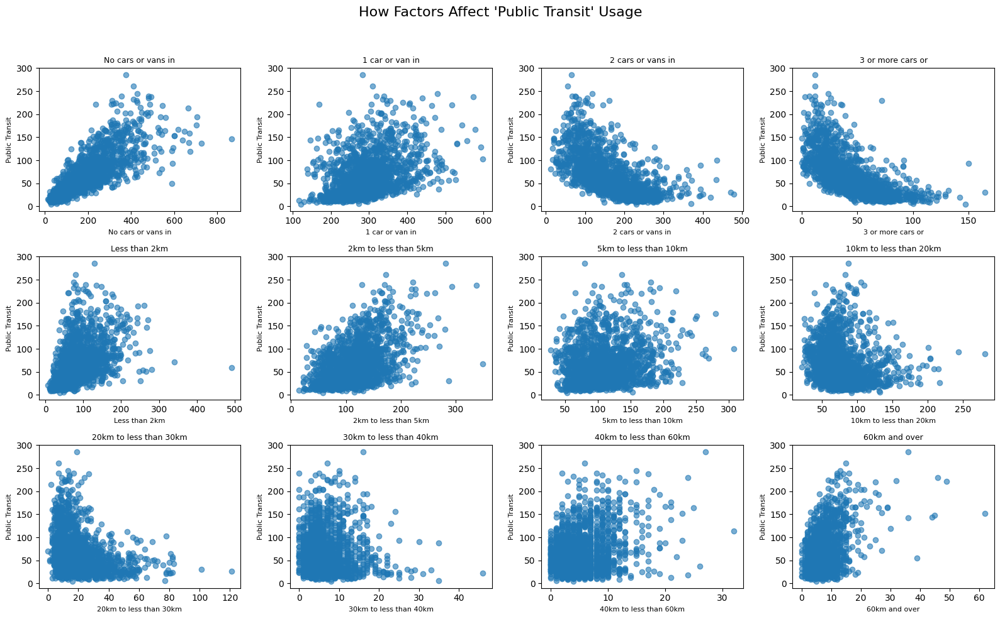

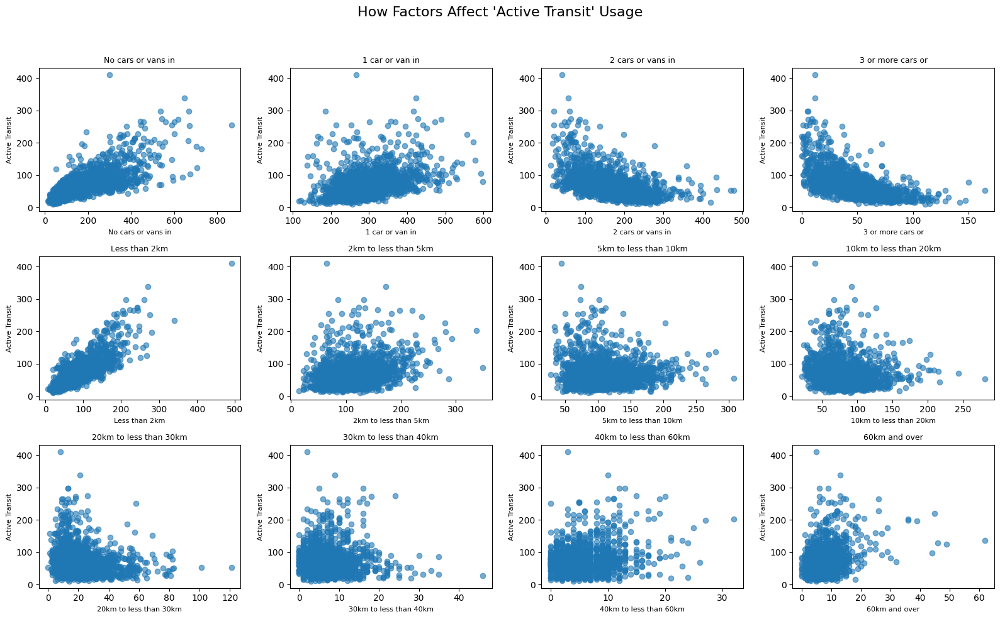

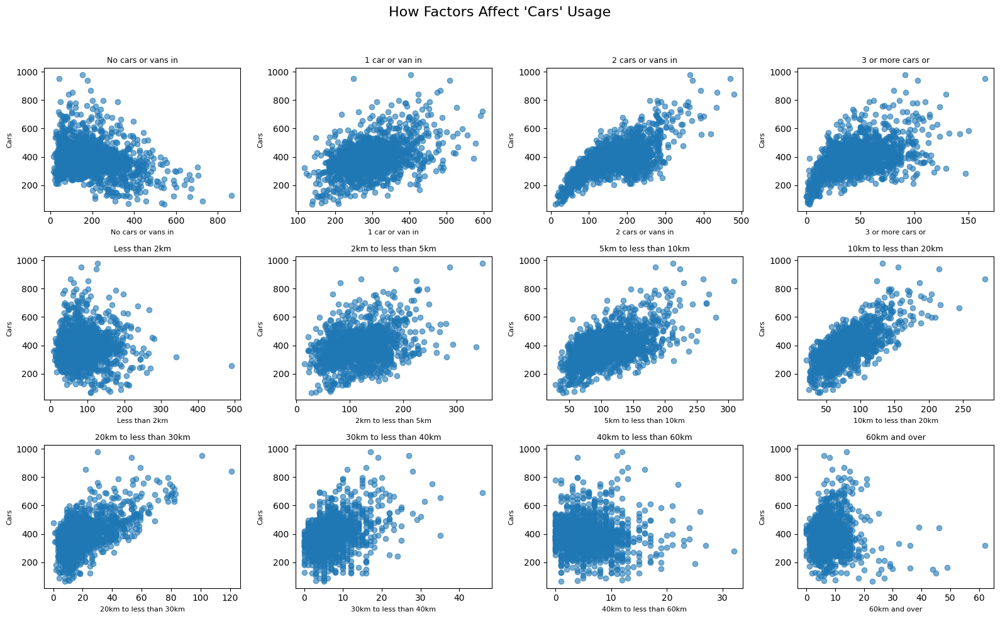

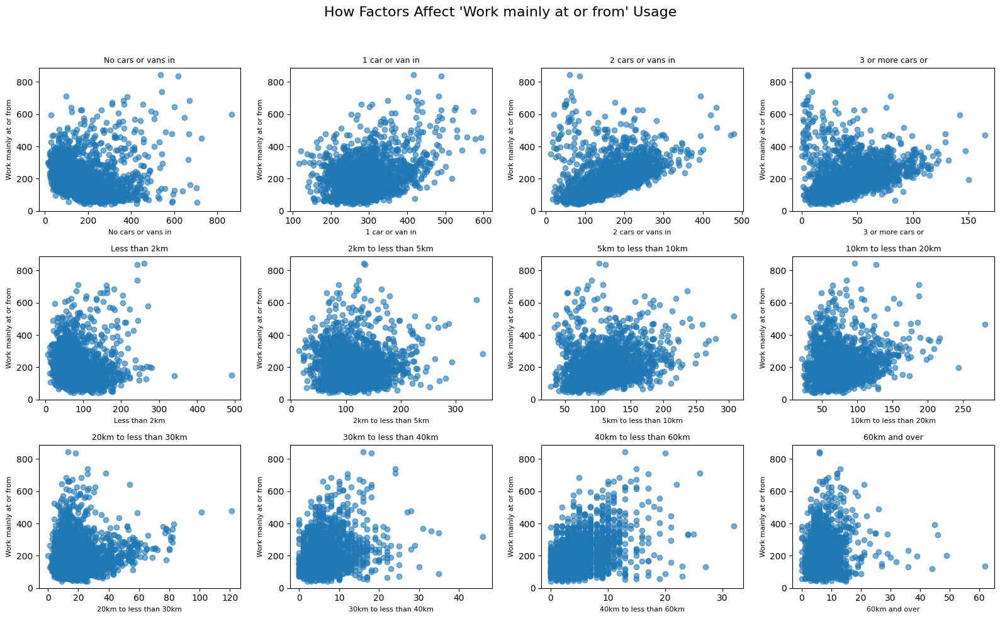

In [17]:
methods = transit_methods_general
factors_to_plot = Factor3

n_factors = len(factors_to_plot)

for method in methods:
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
    axes = axes.flatten()

    for i, factor in enumerate(factors_to_plot):
        if factor in df3.columns and method in df3.columns:
            # Shorten column names to first 5 words
            short_factor = ' '.join(str(factor).split()[:5])
            short_method = ' '.join(str(method).split()[:5])
            axes[i].scatter(df3[factor], df3[method], alpha=0.6)
            axes[i].set_title(short_factor, fontsize=9)
            axes[i].set_xlabel(short_factor, fontsize=8)
            axes[i].set_ylabel(short_method, fontsize=8)
    # Remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"How Factors Affect '{' '.join(str(method).split()[:5])}' Usage", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

### Top 5 effects

In [18]:
X = df3[Factor3]

results = {}

for method in transit_methods_general:
    y = df3[method]
    model = RandomForestRegressor(random_state=0)
    model.fit(X, y)

    importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    results[method] = importance_df.head(5)

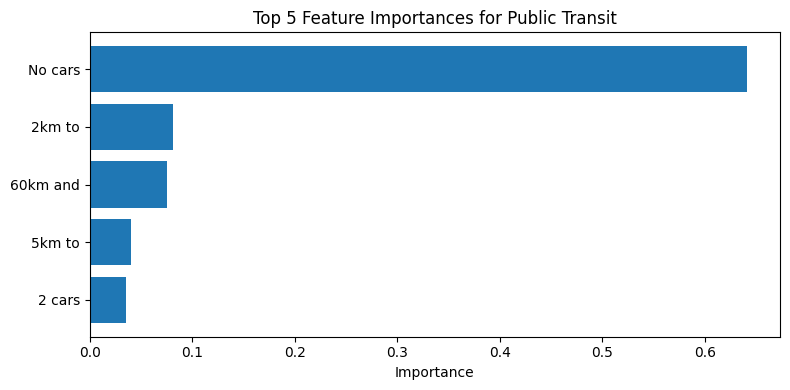

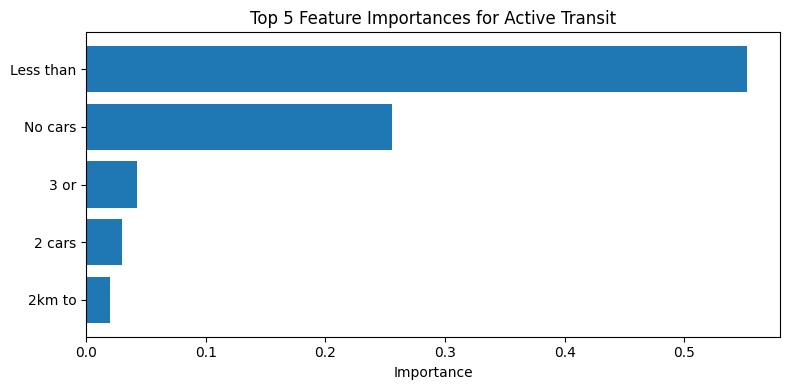

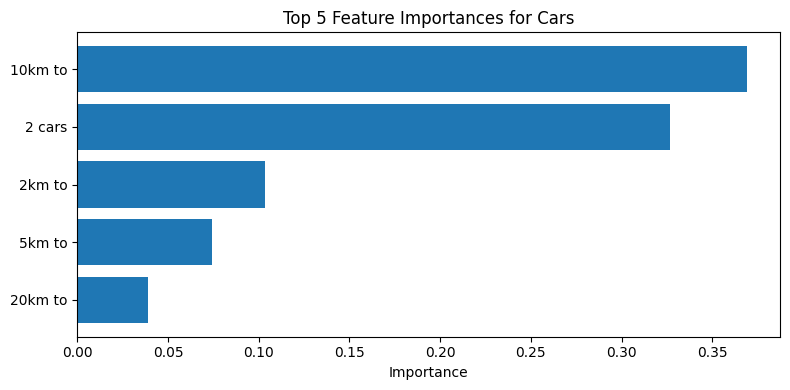

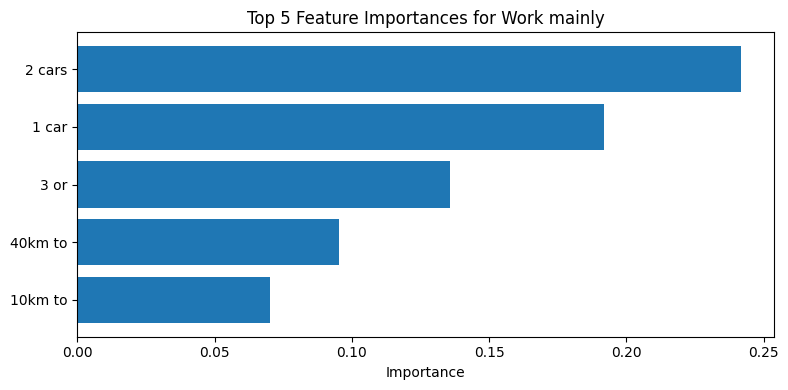

In [19]:
for method, importance_df in results.items():
    # Shorten feature names to first two words
    short_features = [' '.join(str(f).split()[:2]) for f in importance_df['Feature']]
    plt.figure(figsize=(8, 4))
    plt.barh(short_features, importance_df['Importance'])
    plt.xlabel('Importance')
    plt.title(f"Top 5 Feature Importances for {' '.join(method.split()[:2])}")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

### Top 5 effects Partial Dependence

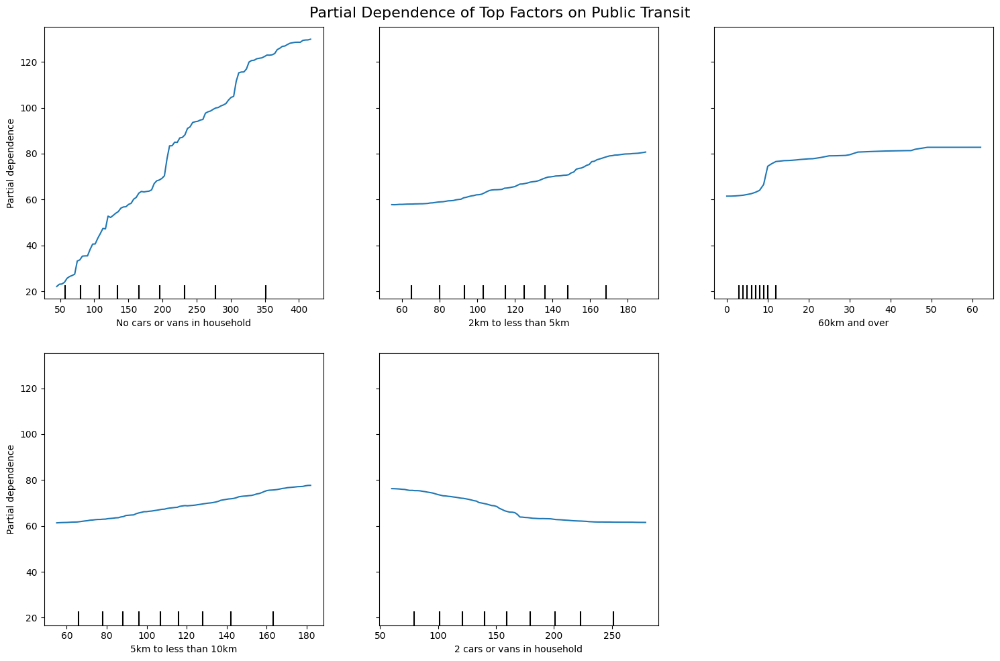

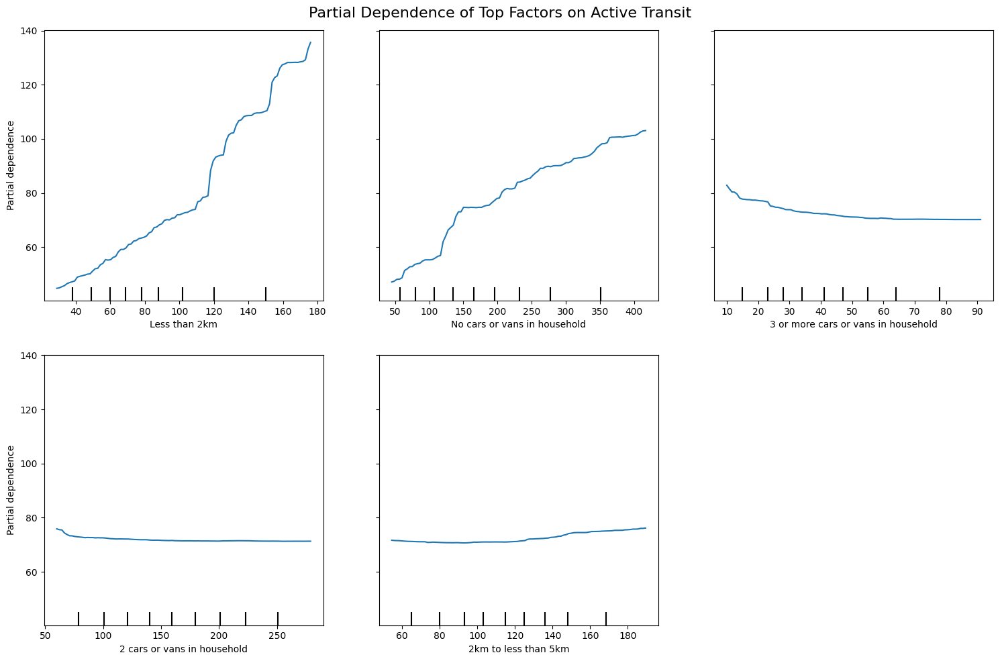

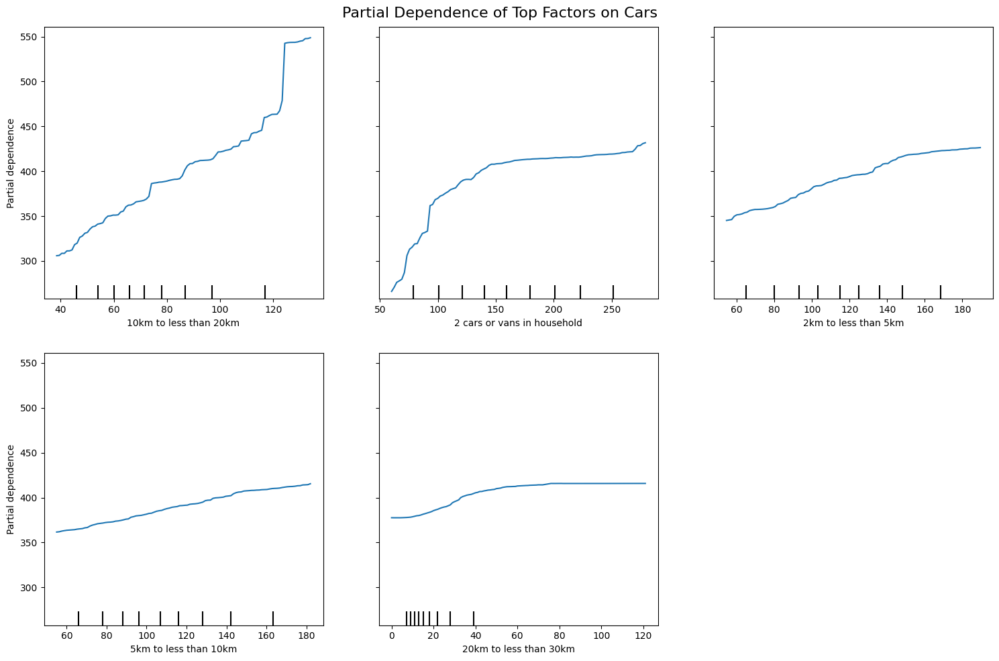

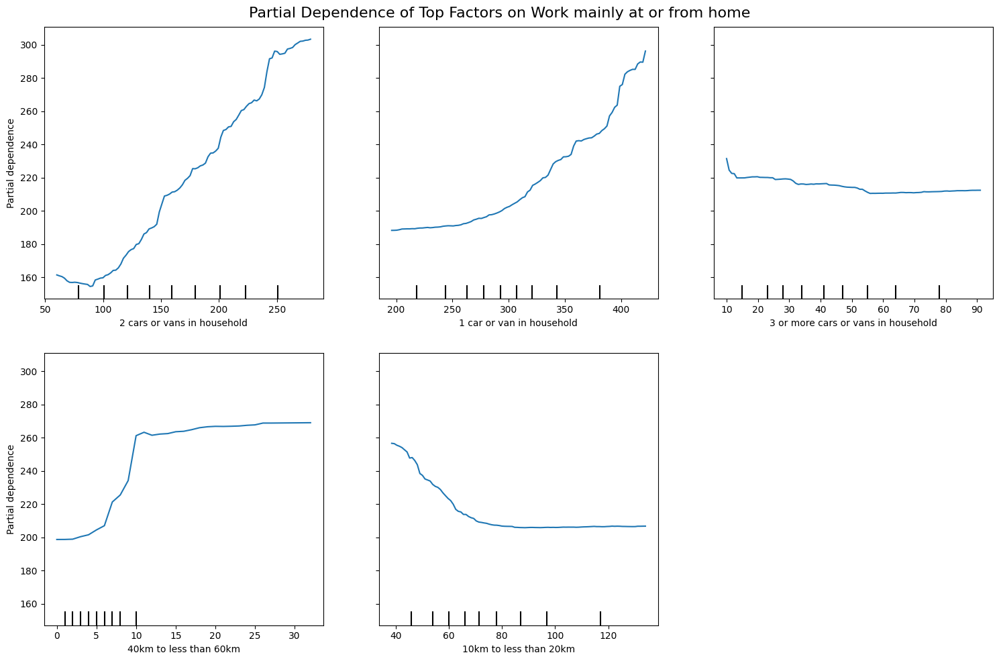

In [20]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

for method in transit_methods_general:
    model.fit(X, df3[method])

    features_to_plot = results[method]['Feature'].tolist()

    fig, ax = plt.subplots(figsize=(15, 10))
    PartialDependenceDisplay.from_estimator(model, X, features_to_plot, ax=ax)
    plt.suptitle(f"Partial Dependence of Top Factors on {method}", fontsize=16)
    plt.tight_layout()
    plt.show()

## Infrusture Effects

In [34]:
import pandas as pd

df = pd.read_csv('C:\\StudySources\\Master\\ERP\\Datasets\\2021\\combined_output.csv')

In [35]:
df['Rail Transit'] = df['Underground, metro, light rail, tram'] + df['Train']
df['Active Transit'] = df['Motorcycle, scooter or moped'] + df['Bicycle'] + df['On foot']
df['Public Transit'] = df['Rail Transit'] + df['Bus, minibus or coach'] + df['Taxi']
df['Cars'] = df['Driving a car or van'] + df['Passenger in a car or van']

transit_methods_general = ['Public Transit', 'Active Transit', 'Cars', 'Work mainly at or from home']
transit_method = ['Rail Transit', 'Bus, minibus or coach', 'Taxi', 'Motorcycle, scooter or moped', 'Bicycle', 'On foot', 'Cars', 'Work mainly at or from home']

In [36]:
df = df[['2021 super output area - lower layer', 'mnemonic', 'Total population 16+', 'Rail Transit', 'Bus, minibus or coach', 'Taxi', 'Motorcycle, scooter or moped', 'Bicycle', 'On foot', 'Cars']]

In [37]:
df_bus = pd.read_csv('bus_Statistics.csv')
df_rail = pd.read_csv('rail_Statistics.csv')

In [38]:
# Rename columns in df_bus (except 'LSOA21CD') to add '_bus' suffix
df_bus_renamed = df_bus.rename(
    columns={col: f"{col}_bus" for col in df_bus.columns if col != 'LSOA21CD'}
)

# Rename columns in df_rail (except 'LSOA21CD') to add '_rail' suffix
df_rail_renamed = df_rail.rename(
    columns={col: f"{col}_rail" for col in df_rail.columns if col != 'LSOA21CD'}
)

In [39]:
df_bus_renamed

,LSOA21CD,MEAN_NEAR_DIST_bus,MIN_NEAR_DIST_bus,MAX_NEAR_DIST_bus,VARIANCE_NEAR_DIST_bus,MEDIAN_NEAR_DIST_bus
0,E01004766,0.067186,0.032670,0.137642,0.002326,0.049217
1,E01004767,0.078055,0.005582,0.145606,0.006081,0.080515
2,E01004768,0.280072,0.112970,0.609452,0.049933,0.198932
3,E01004769,0.050218,0.013369,0.089680,0.001121,0.048912
4,E01004770,0.149449,0.014101,0.334432,0.018753,0.124632
...,...,...,...,...,...,...
1697,E01034138,0.025813,0.004990,0.058404,0.000522,0.019929
1698,E01034232,0.077070,0.030476,0.116266,0.001378,0.080769
1699,E01034233,0.038466,0.012836,0.077682,0.000773,0.031674
1700,E01034234,0.029853,0.002151,0.050487,0.000420,0.033387


In [42]:
df = df.merge(df_bus_renamed, how='left', left_on='mnemonic', right_on='LSOA21CD')
df = df.merge(df_rail_renamed, how='left', left_on='mnemonic', right_on='LSOA21CD')

In [44]:
df = df.drop(columns=['LSOA21CD_x', 'LSOA21CD_y'])

In [45]:
df.columns

Index(['2021 super output area - lower layer', 'mnemonic',
       'Total population 16+', 'Rail Transit', 'Bus, minibus or coach', 'Taxi',
       'Motorcycle, scooter or moped', 'Bicycle', 'On foot', 'Cars',
       'MEAN_NEAR_DIST_bus', 'MIN_NEAR_DIST_bus', 'MAX_NEAR_DIST_bus',
       'VARIANCE_NEAR_DIST_bus', 'MEDIAN_NEAR_DIST_bus', 'MEAN_NEAR_DIST_rail',
       'MIN_NEAR_DIST_rail', 'MAX_NEAR_DIST_rail', 'MEDIAN_NEAR_DIST_rail',
       'VARIANCE_NEAR_DIST_rail'],
      dtype='object')

In [46]:
df_inf = df[['mnemonic', 'Total population 16+', 'Rail Transit', 'Bus, minibus or coach', 'MEAN_NEAR_DIST_bus', 'MIN_NEAR_DIST_bus', 'MAX_NEAR_DIST_bus','VARIANCE_NEAR_DIST_bus', 'MEDIAN_NEAR_DIST_bus', 'MEAN_NEAR_DIST_rail','MIN_NEAR_DIST_rail', 'MAX_NEAR_DIST_rail', 'MEDIAN_NEAR_DIST_rail','VARIANCE_NEAR_DIST_rail']]

In [47]:
df_inf = df_inf.rename(
    columns={
        'Total population 16+': 'Population',
        'Bus, minibus or coach': 'Bus'
        })

In [48]:
df_inf['Bus Percentage'] = df_inf['Bus'] / df_inf['Population'] * 100

df_inf['Rail Transit Percentage'] = df_inf['Rail Transit'] / df_inf['Population'] * 100

In [49]:
df_inf

,mnemonic,Population,Rail Transit,Bus,MEAN_NEAR_DIST_bus,MIN_NEAR_DIST_bus,MAX_NEAR_DIST_bus,VARIANCE_NEAR_DIST_bus,MEDIAN_NEAR_DIST_bus,MEAN_NEAR_DIST_rail,MIN_NEAR_DIST_rail,MAX_NEAR_DIST_rail,MEDIAN_NEAR_DIST_rail,VARIANCE_NEAR_DIST_rail,Bus Percentage,Rail Transit Percentage
0,E01004766,677.0,9.0,22.0,0.067186,0.032670,0.137642,0.002326,0.049217,1.405870,1.289613,1.493004,1.420432,0.007757,3.249631,1.329394
1,E01004767,876.0,17.0,24.0,0.078055,0.005582,0.145606,0.006081,0.080515,0.737835,0.526069,1.167821,0.628726,0.085786,2.739726,1.940639
2,E01004768,842.0,4.0,5.0,0.280072,0.112970,0.609452,0.049933,0.198932,2.610748,2.502146,2.708917,2.615965,0.007388,0.593824,0.475059
3,E01004769,773.0,6.0,11.0,0.050218,0.013369,0.089680,0.001121,0.048912,0.890742,0.752539,1.009995,0.900217,0.016210,1.423027,0.776197
4,E01004770,638.0,7.0,11.0,0.149449,0.014101,0.334432,0.018753,0.124632,0.768247,0.658231,0.894985,0.759886,0.014055,1.724138,1.097179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734,E01034138,419.0,3.0,92.0,0.025813,0.004990,0.058404,0.000522,0.019929,0.483862,0.219339,0.579404,0.568353,0.031130,21.957041,0.715990
1735,E01034232,464.0,25.0,33.0,0.077070,0.030476,0.116266,0.001378,0.080769,0.195809,0.074456,0.296792,0.205994,0.008720,7.112069,5.387931
1736,E01034233,487.0,23.0,21.0,0.038466,0.012836,0.077682,0.000773,0.031674,0.463636,0.409601,0.505892,0.469526,0.001598,4.312115,4.722793
1737,E01034234,569.0,22.0,24.0,0.029853,0.002151,0.050487,0.000420,0.033387,0.975663,0.853594,1.103227,0.972916,0.012469,4.217926,3.866432


In [50]:
import statsmodels.api as sm

# Features for bus and rail
bus_features = [
    'MEAN_NEAR_DIST_bus', 'MIN_NEAR_DIST_bus', 'MAX_NEAR_DIST_bus',
    'VARIANCE_NEAR_DIST_bus', 'MEDIAN_NEAR_DIST_bus'
]
rail_features = [
    'MEAN_NEAR_DIST_rail', 'MIN_NEAR_DIST_rail', 'MAX_NEAR_DIST_rail',
    'VARIANCE_NEAR_DIST_rail', 'MEDIAN_NEAR_DIST_rail'
]

# Targets
bus_target = 'Bus Percentage'
rail_target = 'Rail Transit Percentage'

# Drop rows with missing values for each regression
df_bus_reg = df_inf[bus_features + [bus_target]].dropna()
df_rail_reg = df_inf[rail_features + [rail_target]].dropna()

# Bus regression
X_bus = df_bus_reg[bus_features]
y_bus = df_bus_reg[bus_target]
X_bus_const = sm.add_constant(X_bus)
bus_model = sm.OLS(y_bus, X_bus_const).fit()
print("Regression results for Bus Percentage:")
print(bus_model.summary())

# Rail regression
X_rail = df_rail_reg[rail_features]
y_rail = df_rail_reg[rail_target]
X_rail_const = sm.add_constant(X_rail)
rail_model = sm.OLS(y_rail, X_rail_const).fit()
print("\nRegression results for Rail Transit Percentage:")
print(rail_model.summary())

Regression results for Bus Percentage:
                            OLS Regression Results                            
Dep. Variable:         Bus Percentage   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.066
Method:                 Least Squares   F-statistic:                     25.15
Date:                Thu, 31 Jul 2025   Prob (F-statistic):           1.58e-24
Time:                        15:56:35   Log-Likelihood:                -4960.0
No. Observations:                1702   AIC:                             9932.
Df Residuals:                    1696   BIC:                             9965.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

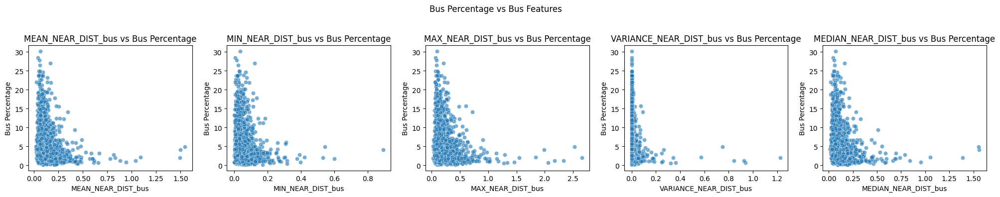

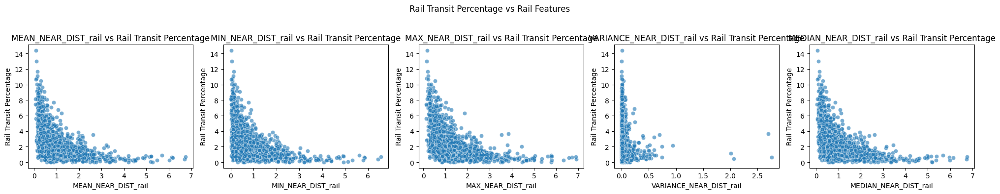

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot for Bus Percentage vs each bus feature
fig, axes = plt.subplots(1, len(bus_features), figsize=(20, 4))
for i, feature in enumerate(bus_features):
    sns.scatterplot(x=df_bus_reg[feature], y=df_bus_reg[bus_target], ax=axes[i], alpha=0.6)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(bus_target)
    axes[i].set_title(f"{feature} vs {bus_target}")
plt.suptitle("Bus Percentage vs Bus Features")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Plot for Rail Transit Percentage vs each rail feature
fig, axes = plt.subplots(1, len(rail_features), figsize=(20, 4))
for i, feature in enumerate(rail_features):
    sns.scatterplot(x=df_rail_reg[feature], y=df_rail_reg[rail_target], ax=axes[i], alpha=0.6)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(rail_target)
    axes[i].set_title(f"{feature} vs {rail_target}")
plt.suptitle("Rail Transit Percentage vs Rail Features")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Decision Tree


Saved: feature_importance_random_forest.csv
Index of Multiple Deprivation (IMD) Decile                               0.413046
60km and over                                                            0.156402
population density                                                       0.074760
Aged 65 years and over                                                   0.059272
L Real estate activities                                                 0.050434
40km to less than 60km                                                   0.048786
Other method of travel to work                                           0.044878
7 people in household                                                    0.040570
8 or more people in household                                            0.026436
E Water supply; sewerage, waste management and remediation activities    0.026276
30km to less than 40km                                                   0.024249
D Electricity, gas, steam and air conditioning supply

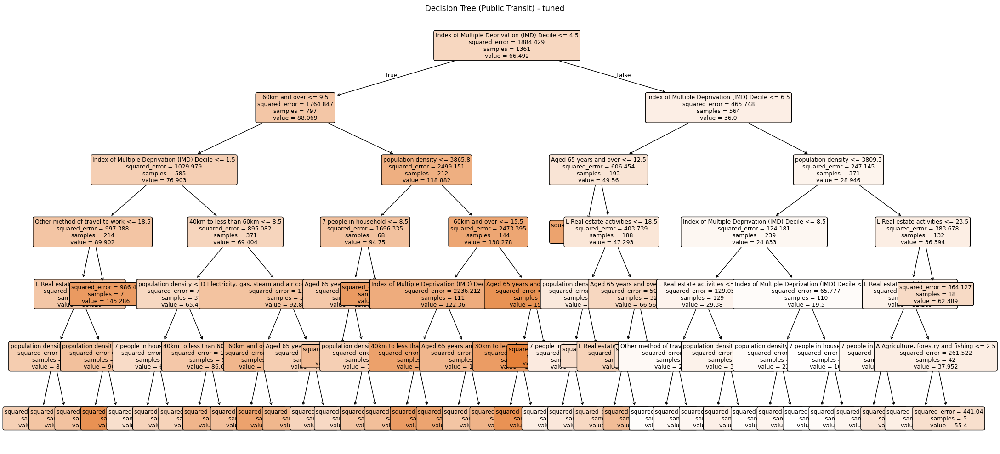

Saved: decision_tree.png
Saved: decision_tree_rules.txt


In [18]:
# ======= CONFIG =======
CSV_PATH = r"C:\\StudySources\\Master\\ERP\\Datasets\\2021\\combined_output.csv"   # 改成你的数据路径
TARGET = "Public Transit"               # 改成你的目标列名（数值型）
RANDOM_STATE = 42
MAX_DEPTH_OPTIONS = [3, 4, 5, 6]
MIN_SAMPLES_LEAF_OPTIONS = [5, 10, 20, 40]
MIN_SAMPLES_SPLIT_OPTIONS = [10, 20, 40, 80]
# ======================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text

# ---- 1) 读取数据 ----
df = df.copy()

# 你基于 VIF 选出的列（已按你截图整理）
selected_features = [
    "Aged 65 years and over",
    "30km to less than 40km",
    "40km to less than 60km",
    "60km and over",
    "7 people in household",
    "8 or more people in household",
    "Index of Multiple Deprivation (IMD) Decile",
    "A Agriculture, forestry and fishing",
    "B Mining and quarrying",
    "D Electricity, gas, steam and air conditioning supply",
    "E Water supply; sewerage, waste management and remediation activities",
    "L Real estate activities",
    "population density",
    "Other method of travel to work",
]

# 仅使用数据中实际存在的列（以防列名细微差异）
exists = [c for c in selected_features if c in df.columns]
missing = [c for c in selected_features if c not in df.columns]
if missing:
    print("Warning: the following selected features are missing in the CSV and will be skipped:")
    for m in missing:
        print(" -", m)

# 目标列检查
if TARGET not in df.columns:
    raise ValueError(f"TARGET '{TARGET}' not found in columns. Please set TARGET to an existing numeric column.")

# 仅保留数值型特征
exists_numeric = [c for c in exists if pd.api.types.is_numeric_dtype(df[c])]
if len(exists_numeric) == 0:
    raise ValueError("No numeric selected features found. Please check column names and types.")

X = df[exists_numeric].copy()
y = df[TARGET].astype(float).copy()

# ---- 2) 训练/测试 切分 ----
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE
)

# ---- 3) 用随机森林查看特征重要性（可帮助你写报告）----
rf = RandomForestRegressor(n_estimators=600, random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_train.fillna(X_train.median(numeric_only=True)), y_train)
rf_imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
rf_imp.to_csv("feature_importance_random_forest.csv")
print("\nSaved: feature_importance_random_forest.csv")
print(rf_imp.head(15))

# ---- 4) 调参得到紧凑的决策树 ----
pipe = Pipeline(steps=[
    ("impute", SimpleImputer(strategy="median")),
    ("tree", DecisionTreeRegressor(random_state=RANDOM_STATE))
])

param_grid = {
    "tree__max_depth": MAX_DEPTH_OPTIONS,
    "tree__min_samples_leaf": MIN_SAMPLES_LEAF_OPTIONS,
    "tree__min_samples_split": MIN_SAMPLES_SPLIT_OPTIONS,
}

gs = GridSearchCV(pipe, param_grid, cv=5, n_jobs=-1, scoring="r2")
gs.fit(X_train, y_train)

best_model = gs.best_estimator_
best_params = gs.best_params_
print("\nBest params:", best_params)

# ---- 5) 评估 ----
y_pred = best_model.predict(X_test)
print(f"Test R^2 : {r2_score(y_test, y_pred):.3f}")
print(f"Test MAE : {mean_absolute_error(y_test, y_pred):.3f}")

# ---- 6) 导出树图与文本规则 ----
fitted_tree: DecisionTreeRegressor = best_model.named_steps["tree"]

plt.figure(figsize=(22, 10))
plot_tree(
    fitted_tree,
    feature_names=X.columns.tolist(),
    filled=True,
    rounded=True,
    fontsize=9
)
plt.title("Decision Tree (Public Transit) - tuned")
plt.tight_layout()
plt.savefig("decision_tree.png", dpi=240)
plt.show()
print("Saved: decision_tree.png")

rules_text = export_text(fitted_tree, feature_names=list(X.columns), decimals=3)
with open("decision_tree_rules.txt", "w", encoding="utf-8") as f:
    f.write(rules_text)
print("Saved: decision_tree_rules.txt")


Top features for compact tree: ['Index of Multiple Deprivation (IMD) Decile', '60km and over', 'population density', 'Aged 65 years and over', 'L Real estate activities', '40km to less than 60km']


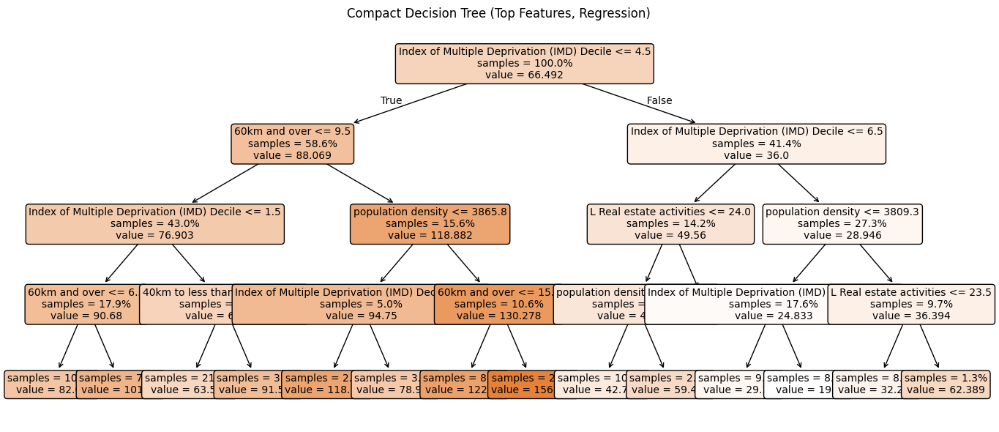

|--- Index of Multiple Deprivation (IMD) Decile <= 4.500
|   |--- 60km and over <= 9.500
|   |   |--- Index of Multiple Deprivation (IMD) Decile <= 1.500
|   |   |   |--- 60km and over <= 6.500
|   |   |   |   |--- value: [82.660]
|   |   |   |--- 60km and over >  6.500
|   |   |   |   |--- value: [101.660]
|   |   |--- Index of Multiple Deprivation (IMD) Decile >  1.500
|   |   |   |--- 40km to less than 60km <= 8.500
|   |   |   |   |--- value: [63.503]
|   |   |   |--- 40km to less than 60km >  8.500
|   |   |   |   |--- value: [91.581]
|   |--- 60km and over >  9.500
|   |   |--- population density <= 3865.800
|   |   |   |--- Index of Multiple Deprivation (IMD) Decile <= 1.500
|   |   |   |   |--- value: [118.741]
|   |   |   |--- Index of Multiple Deprivation (IMD) Decile >  1.500
|   |   |   |   |--- value: [78.951]
|   |   |--- population density >  3865.800
|   |   |   |--- 60km and over <= 15.500
|   |   |   |   |--- value: [122.360]
|   |   |   |--- 60km and over >  15.500
|

In [20]:
from sklearn.tree import export_text, DecisionTreeRegressor

# 选择特征重要性排名前6的特征，重新训练更紧凑的决策树
top_features = rf_imp.head(6).index.tolist()
print("Top features for compact tree:", top_features)

X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

# 重新训练决策树回归器
compact_tree = DecisionTreeRegressor(
    max_depth=4, min_samples_leaf=10, min_samples_split=20, random_state=RANDOM_STATE
)
compact_tree.fit(X_train_top, y_train)

# 可视化紧凑树
plt.figure(figsize=(14, 6))
plot_tree(
    compact_tree,
    feature_names=top_features,
    filled=True,
    rounded=True,
    fontsize=10,
    impurity=False,
    proportion=True,
    max_depth=4,
    node_ids=False,
)
plt.title("Compact Decision Tree (Top Features, Regression)")
plt.tight_layout()
plt.show()

# 导出规则文本
rules_text_compact = export_text(compact_tree, feature_names=top_features, decimals=3)
print(rules_text_compact)

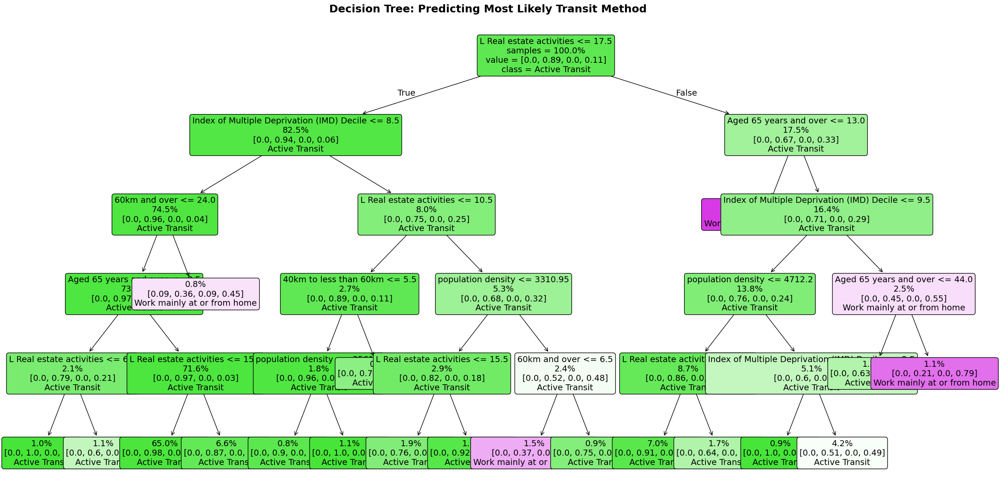

In [15]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# 假设你已经有 top_features, X_train_top, y_train, clf, transit_methods_general

# 训练决策树分类器（如果还没训练）
# clf = DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, random_state=42)
# clf.fit(X_train_top, y_train)

plt.figure(figsize=(24, 12))  # 更大画布
plot_tree(
    clf,
    feature_names=top_features,
    class_names=transit_methods_general,
    filled=True,
    rounded=True,
    fontsize=14,         # 更大字体
    impurity=False,      # 去掉杂质显示
    proportion=True,     # 显示比例
    precision=2,         # 小数点精度
    node_ids=False,      # 不显示节点ID
    label='root'         # 只在根节点显示类别
)
plt.title("Decision Tree: Predicting Most Likely Transit Method", fontsize=18, fontweight='bold')
plt.tight_layout(pad=2.0)  # 增加间距
plt.show()


In [21]:
from sklearn.ensemble import RandomForestRegressor

# Select top 10 features by importance
top10_features = rf_imp.head(10).index.tolist()
print("Top 10 features:", top10_features)

X_top10 = X[top10_features]

# Fit random forest on top 10 features
rf_top10 = RandomForestRegressor(n_estimators=600, random_state=42, n_jobs=-1)
rf_top10.fit(X_top10, y)

# Show feature importances
importances_top10 = pd.Series(rf_top10.feature_importances_, index=top10_features).sort_values(ascending=False)
print("Random Forest feature importances (top 10):")
print(importances_top10)

Top 10 features: ['Index of Multiple Deprivation (IMD) Decile', '60km and over', 'population density', 'Aged 65 years and over', 'L Real estate activities', '40km to less than 60km', 'Other method of travel to work', '7 people in household', '8 or more people in household', 'E Water supply; sewerage, waste management and remediation activities']
Random Forest feature importances (top 10):
Index of Multiple Deprivation (IMD) Decile                               0.429900
60km and over                                                            0.166311
population density                                                       0.078409
Aged 65 years and over                                                   0.063747
40km to less than 60km                                                   0.056431
L Real estate activities                                                 0.051068
Other method of travel to work                                           0.044982
7 people in household             

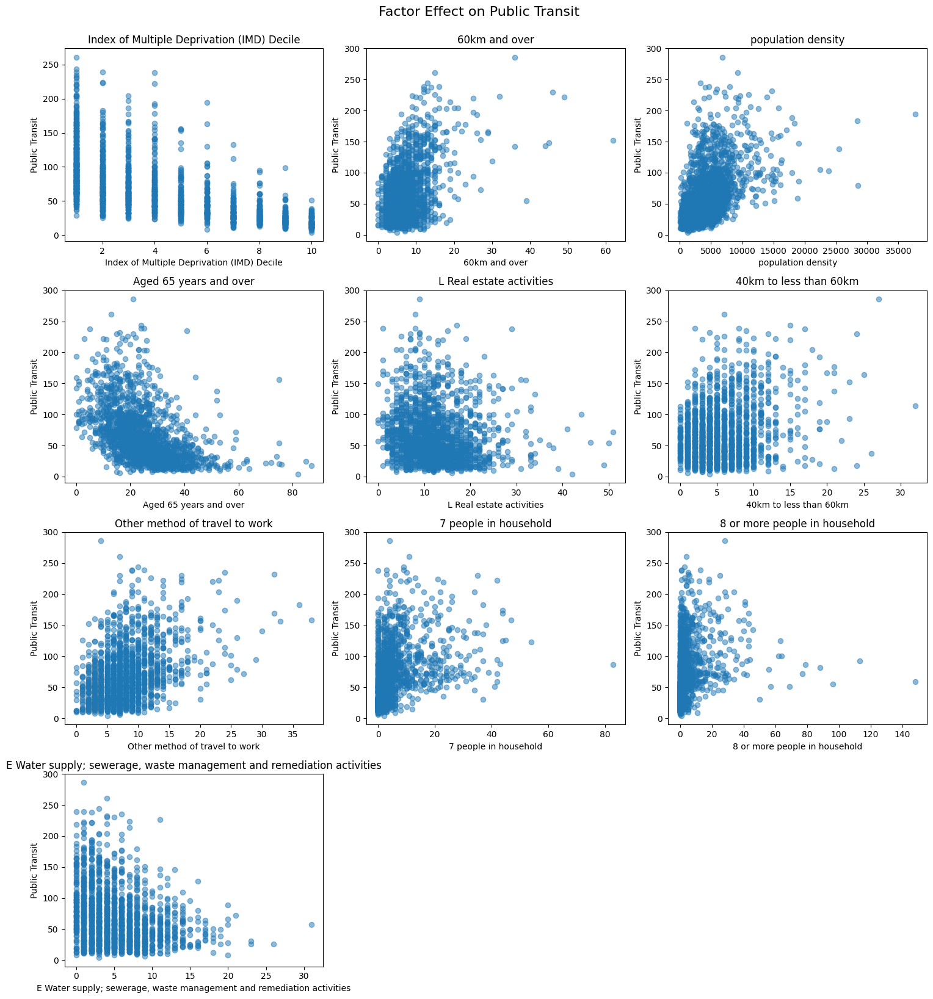

In [22]:
import matplotlib.pyplot as plt

# 选择用于展示的特征（如 top10_features 或 top_features）
features_to_plot = top10_features if 'top10_features' in globals() else exists_numeric

n_features = len(features_to_plot)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    axes[i].scatter(X[feature], y, alpha=0.5)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Public Transit')
    axes[i].set_title(feature)

# 删除多余子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Factor Effect on Public Transit", fontsize=16, y=1.02)
plt.show()


Top 5 occupations for Public Transit:
                                           Occupation  Importance
8         I Accommodation and food service activities    0.599933
13    N Administrative and support service activities    0.078587
5                                      F Construction    0.049993
7                             H Transport and storage    0.043832
14  O Public administration and defence; compulsor...    0.025334

Top 5 occupations for Active Transit:
                                           Occupation  Importance
8         I Accommodation and food service activities    0.459187
15                                        P Education    0.085062
12  M Professional, scientific and technical activ...    0.076177
9                     J Information and communication    0.060346
16          Q Human health and social work activities    0.044145

Top 5 occupations for Cars:
                                           Occupation  Importance
5                                  

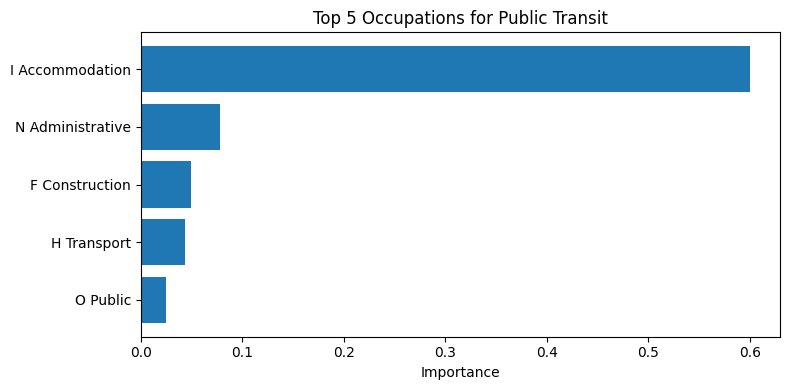

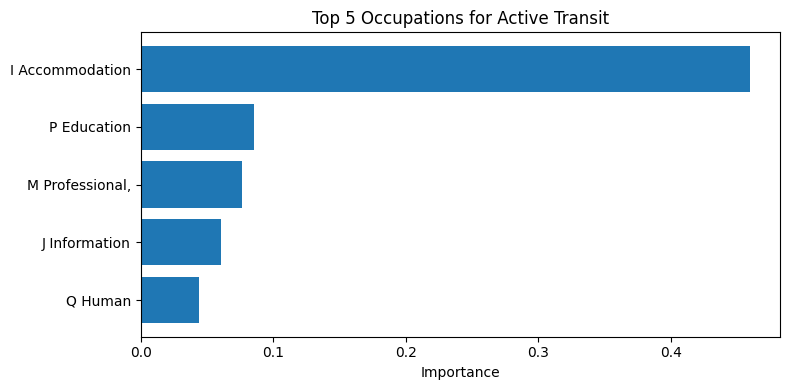

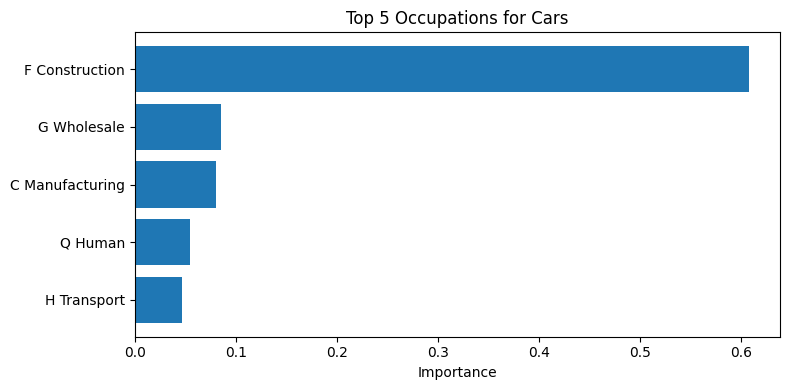

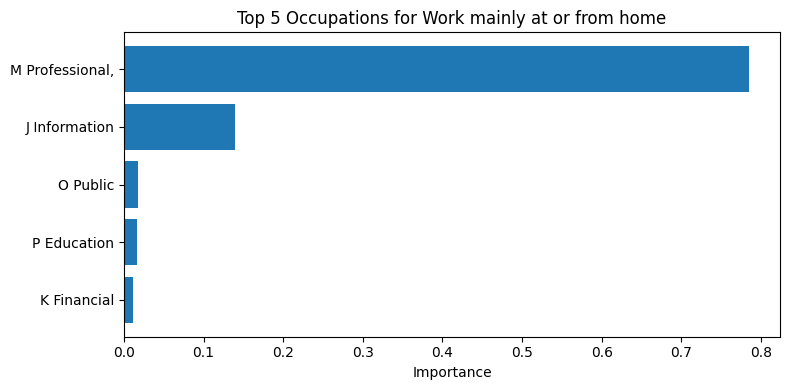

In [24]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# 所有职业列
occupation_cols = [
    'A Agriculture, forestry and fishing',
    'B Mining and quarrying',
    'C Manufacturing',
    'D Electricity, gas, steam and air conditioning supply',
    'E Water supply; sewerage, waste management and remediation activities',
    'F Construction',
    'G Wholesale and retail trade; repair of motor vehicles and motor cycles',
    'H Transport and storage',
    'I Accommodation and food service activities',
    'J Information and communication',
    'K Financial and insurance activities',
    'L Real estate activities',
    'M Professional, scientific and technical activities',
    'N Administrative and support service activities',
    'O Public administration and defence; compulsory social security',
    'P Education',
    'Q Human health and social work activities',
    'R, S, T, U Other'
]

results = {}

for method in transit_methods_general:
    X = df[occupation_cols]
    y = df[method]
    model = RandomForestRegressor(random_state=0)
    model.fit(X, y)
    importance_df = pd.DataFrame({
        'Occupation': occupation_cols,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    results[method] = importance_df.head(5)
    print(f"\nTop 5 occupations for {method}:")
    print(importance_df.head(5))

# 可视化
import matplotlib.pyplot as plt
for method, importance_df in results.items():
    # 只取前两个词作为标签
    short_occupations = [' '.join(str(o).split()[:2]) for o in importance_df['Occupation']]
    plt.figure(figsize=(8, 4))
    plt.barh(short_occupations, importance_df['Importance'])
    plt.xlabel('Importance')
    plt.title(f"Top 5 Occupations for {method}")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [54]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder, StandardScaler

# 只用职业和出行距离相关特征
svm_features = [
    # 职业
    'A Agriculture, forestry and fishing',
    'B Mining and quarrying',
    'C Manufacturing',
    'D Electricity, gas, steam and air conditioning supply',
    'E Water supply; sewerage, waste management and remediation activities',
    'F Construction',
    'G Wholesale and retail trade; repair of motor vehicles and motor cycles',
    'H Transport and storage',
    'I Accommodation and food service activities',
    'J Information and communication',
    'K Financial and insurance activities',
    'L Real estate activities',
    'M Professional, scientific and technical activities',
    'N Administrative and support service activities',
    'O Public administration and defence; compulsory social security',
    'P Education',
    'Q Human health and social work activities',
    'R, S, T, U Other',
    # 出行距离
    'Less than 2km',
    '2km to less than 5km',
    '5km to less than 10km',
    '10km to less than 20km',
    '20km to less than 30km',
    '30km to less than 40km',
    '40km to less than 60km',
    '60km and over'
]
# 只保留数据中实际存在的列
svm_features = [f for f in svm_features if f in df.columns]

# 目标变量：最常用出行方式（每行取这四列中值最大的列名作为类别标签）
df_mode = ['Public Transit', 'Active Transit', 'Cars', 'Work mainly at or from home']
X = df[svm_features].copy()
y = df[df_mode].idxmax(axis=1)  # 取每行最大值对应的列名作为类别

# 编码目标变量
le = LabelEncoder()
y_enc = le.fit_transform(y)

# 过滤掉只出现1次的类别，避免stratify报错
import numpy as np
(unique, counts) = np.unique(y_enc, return_counts=True)
valid_classes = unique[counts > 1]
mask = np.isin(y_enc, valid_classes)
X_filtered = X[mask]
y_enc_filtered = y_enc[mask]

# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_filtered)

# 划分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_enc_filtered, test_size=0.2, random_state=42, stratify=y_enc_filtered
)

# 训练SVM分类器
svm = SVC(kernel='rbf', C=2, gamma='scale', probability=True, random_state=42)
svm.fit(X_train, y_train)

# 预测与评估
y_pred = svm.predict(X_test)
print("SVM分类报告：")
# 只用y_test中实际出现的类别
unique_labels = np.unique(y_test)
filtered_target_names = le.classes_[unique_labels]
print(classification_report(y_test, y_pred, labels=unique_labels, target_names=filtered_target_names))
print("混淆矩阵：")
print(confusion_matrix(y_test, y_pred, labels=unique_labels))

SVM分类报告：
                             precision    recall  f1-score   support

             Active Transit       0.00      0.00      0.00         1
                       Cars       0.98      0.99      0.98       299
Work mainly at or from home       0.90      0.90      0.90        41

                   accuracy                           0.97       341
                  macro avg       0.63      0.63      0.63       341
               weighted avg       0.97      0.97      0.97       341

混淆矩阵：
[[  0   1   0]
 [  0 295   4]
 [  0   4  37]]


C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

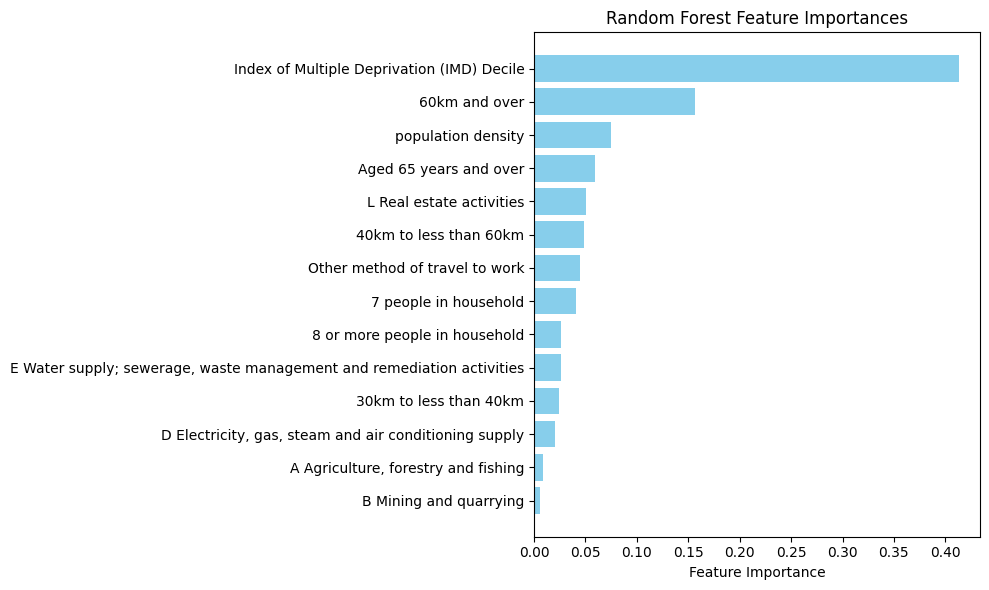

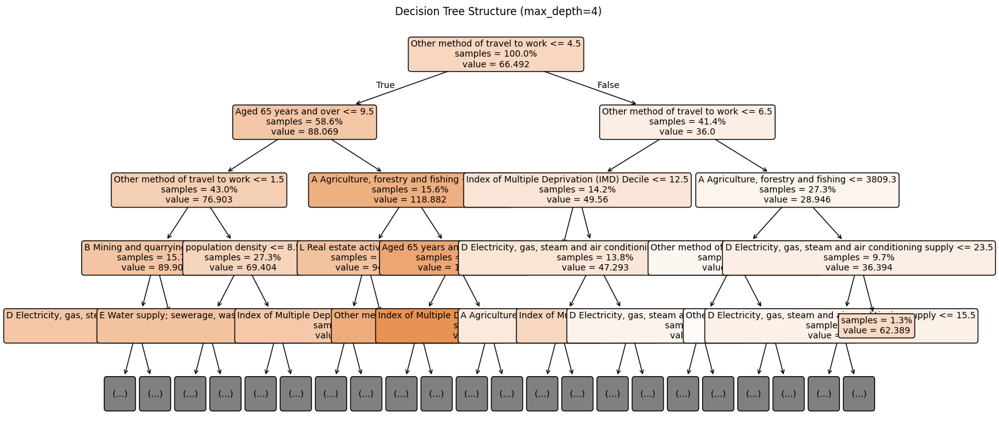

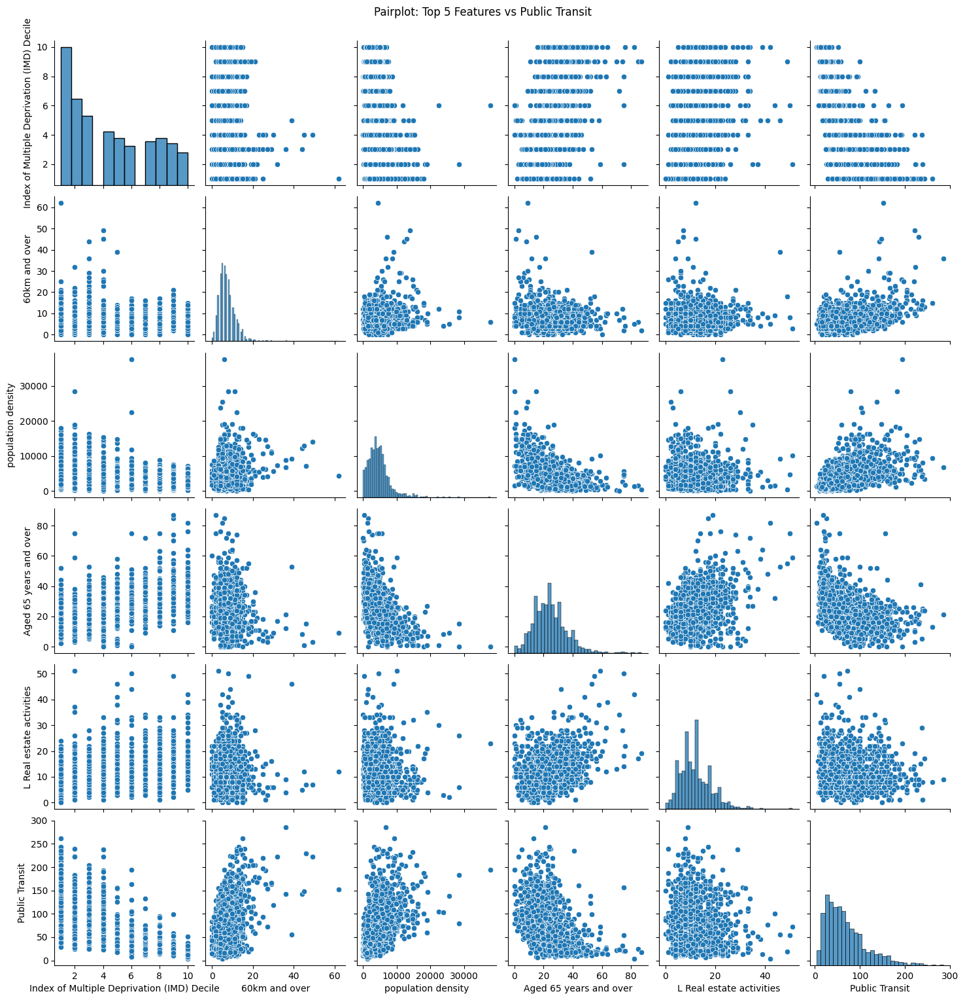

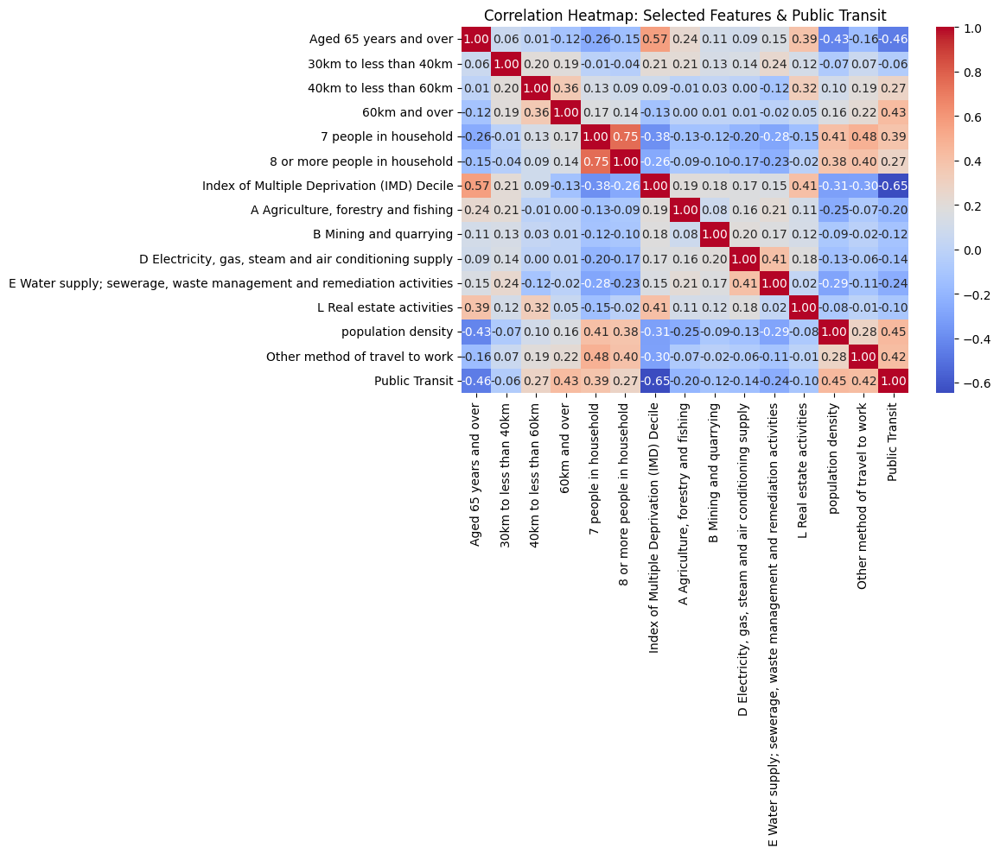

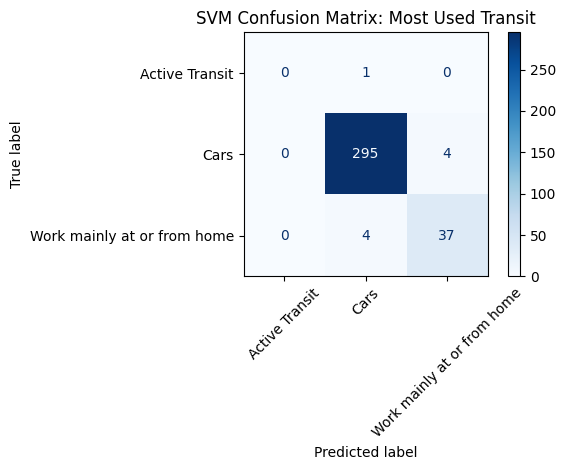

In [45]:
import seaborn as sns
from sklearn.tree import plot_tree
from sklearn.metrics import ConfusionMatrixDisplay

import matplotlib.pyplot as plt

# 1. Feature importance bar plot (Random Forest)
plt.figure(figsize=(10, 6))
rf_imp_sorted = rf_imp.sort_values(ascending=True)
plt.barh(rf_imp_sorted.index, rf_imp_sorted.values, color='skyblue')
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importances")
plt.tight_layout()
plt.show()

# 2. Decision tree structure (already shown, but can show compact tree again)

plt.figure(figsize=(16, 7))
plot_tree(
    fitted_tree,
    feature_names=rf_imp.index.tolist(),
    filled=True,
    rounded=True,
    fontsize=10,
    impurity=False,
    proportion=True,
    max_depth=4
)
plt.title("Decision Tree Structure (max_depth=4)")
plt.tight_layout()
plt.show()

# 3. Pairplot for top 5 features vs target
top5 = rf_imp.head(5).index.tolist()
sns.pairplot(df[top5 + ['Public Transit']])
plt.suptitle("Pairplot: Top 5 Features vs Public Transit", y=1.02)
plt.show()

# 4. Correlation heatmap for selected features
corr = df[exists_numeric + ['Public Transit']].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap: Selected Features & Public Transit")
plt.tight_layout()
plt.show()

# 5. Confusion matrix for SVM classifier

ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred, display_labels=filtered_target_names, cmap="Blues", xticks_rotation=45
)
plt.title("SVM Confusion Matrix: Most Used Transit")
plt.tight_layout()
plt.show()

In [50]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder, StandardScaler
import numpy as np

# 只用出行距离相关特征
distance_features = [
    'Less than 2km',
    '2km to less than 5km',
    '5km to less than 10km',
    '10km to less than 20km',
    '20km to less than 30km',
    '30km to less than 40km',
    '40km to less than 60km',
    '60km and over'
]
distance_features = [f for f in distance_features if f in df.columns]

# 目标变量：最常用出行方式
y = df_mode
X = df[distance_features].copy()

# 编码目标变量
le = LabelEncoder()
y_enc = le.fit_transform(y)

# 过滤掉只出现1次的类别，避免stratify报错
(unique, counts) = np.unique(y_enc, return_counts=True)
valid_classes = unique[counts > 1]
mask = np.isin(y_enc, valid_classes)
X_filtered = X[mask]
y_enc_filtered = y_enc[mask]

# 标准化特征
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_filtered)

# 划分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_enc_filtered, test_size=0.2, random_state=42, stratify=y_enc_filtered
)

# 训练SVM分类器
svm = SVC(kernel='rbf', C=2, gamma='scale', probability=True, random_state=42)
svm.fit(X_train, y_train)

# 预测与评估
y_pred = svm.predict(X_test)
unique_labels = np.unique(y_test)
filtered_target_names = le.classes_[unique_labels]
print("SVM分类报告：")
print(classification_report(y_test, y_pred, labels=unique_labels, target_names=filtered_target_names))
print("混淆矩阵：")
print(confusion_matrix(y_test, y_pred, labels=unique_labels))

SVM分类报告：
                             precision    recall  f1-score   support

             Active Transit       0.00      0.00      0.00         1
                       Cars       0.90      0.99      0.94       299
Work mainly at or from home       0.69      0.22      0.33        41

                   accuracy                           0.89       341
                  macro avg       0.53      0.40      0.42       341
               weighted avg       0.87      0.89      0.87       341

混淆矩阵：
[[  0   1   0]
 [  0 295   4]
 [  0  32   9]]


C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Harry.Xie\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap